<a href="https://colab.research.google.com/github/jvallalta/primeros-pasos/blob/main/Primera_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Modelos generativos
En primer lugar vamos a ver qué son los modelos generativos y qué tipos existen.

Lo primero que hemos de diferenciar es entre modelos discriminativos y modelos generativos. 
- Los modelos discriminativos nos permiten diferenciar entre clases y son los más conocidos dentro del machine learning. También los llamamos clasificadores. Los modelos discriminativos son capaces de determinar a partir de una seríe de características X la clase a la que pertenecen Y (X->Y). Es decir, intentan modelar la probablidad P(Y|X).
- Los modelos generativos intentan hacer una representación realista de una clase. Toman como entrada ruido aleatorio y quizás un clase y generan las caracteristicas (Ruido, Y ->X). El ruido aleatorio se utilizar para no generar cada vez el mismo elemento de la clase (por ejemplo, el mismo perro). Los modelos generativos intentan modelar la probabilidad P(X|Y). Los modelos generativos más utilizados son:
  - Autoencoders variacionales (VAE).
  - Redes generativas antagónicas (GAN).

En resumen, un modelo generativo aprender a generar ejemplos realistas de datos.

Las GANs se pueden utilizar para:
- Generar imágenes realistas.
- Transferir estilos entre dominios (CycleGAN).
- Generar imágenes a partir de dibujos o bocetos.
- Generar imagen 3D de un objeto a partir de su imagen 2D.


[Esta persona no existe](https://www.thispersondoesnotexist.com/)

# Intuición detrás de las GANs
Una GAN tienes dos componentes: el generador y el discriminador. Son dos redes neuronales diferentes. El generador tiene como objetivo generar imágenes que puedan ser reales y engañar al discriminador.  El discriminador debe aprender a distinguir lo que es real de lo que es falso.

## Discriminador

El discriminador es un tipo de clasificador. Un clasificador es capaz de diferenciar entre clases (por ejemplo: ganto y no gato). Una implementación de un clasificador se puede realizar con una red neuronal que tiene como entrada las características y como salida la probabilidad de que la entrada pertenezca a una determinada clase.

El discriminador es un clasficador que determina si la imagen es real o fake. En términos probabilísticos el discriminador modela probabilidad de que un ejemplo sea fake dada unas características de entrada X. 

Por tanto, el discriminador es un clasificador. Modela la probabilidad de la clase Y (real or fake) dadas las caraterísticas X. Las probabilidades son el feedback al generador.

# Generador

El generador crea ejemplos de la clase. Tiene como entrada una vector aleatorio para no generar cada vez la misma imagen. El generador produce datos falsos.  Modela la probabilidad de las características X y tiene como entrada un vector aleatorio.


# Binary Cross Entropy: función de coste

La función de coste tiene dos partes (una relevante para cada clase). Tiene un valor próximo a 0 cuando la etiqueta y la predicción son similares y tiene a infinito cuando se diferencian.

# Implementando la primera GAN
Vamos a implementar nuestra primera GAN capaz de generar imágenes de dígitos (0-9) manuscritos. Utilzaresmos Pytorch.

Nuestos objetivos serán:
- Construir el generador y el discriminador desde 0.
- Implementar las funciones de perdida del generador y el discriminador.
- Entrenar la GAN y visualizar las imágenes generadas.

## Empezando

Empezaremos importando los paquetes que vamos a necesitar, el dataset y definiendo  una función de visualización  que nos resultará muy útil.

In [12]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Investigación reproducible

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Función para la visualización de imágenes: Dado un tensor de imágenes, número de imágenes, y tamaño por imagen, 
    visualiza las imágenes en un grid uniforme.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

### Conjunto de datos MNIST
Las imágenes de entrenamiento que usaré el discriminador provienen de un conjunto de datos llamado MNIST. Contiene 60.000 imágenes de dígitos escritos a mano, del 0 al 9, como estos:

### Dígitos MNIST

Se nota que las imágenes están bastante pixeladas, ¡esto se debe a que todas tienen solo 28 x 28! El pequeño tamaño de sus imágenes hace que MNIST sea ideal para un entrenamiento sencillo. Además, estas imágenes también están en blanco y negro, por lo que solo se necesita una dimensión, o "canal de color", para representarlas.

### Tensor
Representarás los datos usando tensores. Los tensores son una generalización de matrices: por ejemplo, una pila de tres matrices con las cantidades de rojo, verde y azul en diferentes ubicaciones en una imagen de 64 x 64 píxeles es un tensor con la forma de 3 x 64 x 64.

Los tensores son fáciles de manipular y compatibles con PyTorch, la biblioteca de aprendizaje automático que utilizarames, puedes imaginarlos como matrices o vectores multidimensionales.

### Batch
Si bien puede entrenar su modelo después de generar una imagen, es extremadamente ineficiente y conduce a un entrenamiento menos estable. En las GAN, y en el aprendizaje automático en general, procesamos varias imágenes por paso de entrenamiento. Estos se denominan lotes.

Esto significa que su generador generará un lote completo de imágenes y recibirá los comentarios del discriminador sobre cada una antes de actualizar el modelo. Lo mismo ocurre con el discriminador, calculará su pérdida en todo el lote de imágenes generadas, así como en los reales antes de que se actualice el modelo.

## Generador
El primer paso es construir el componente generador.

Comenzará creando una función para hacer una sola capa / bloque para la red neuronal del generador. Cada bloque debe incluir una transformación lineal para mapear a otra forma, una normalización por lotes para la estabilización y, finalmente, una función de activación no lineal (aquí usa un ReLU) para que la salida se pueda transformar de maneras complejas.

In [2]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

Ahora puedes construir la clase de generador. Tomará 3 valores:

- La dimensión del vector de ruido
- La dimensión de la imagen
- La dimensión oculta inicial

Usando estos valores, el generador construirá una red neuronal con 5 capas / bloques. Comenzando con el vector de ruido, el generador aplicará transformaciones no lineales a través de la función de bloque hasta que el tensor se asigne al tamaño de la imagen que se va a generar (el mismo tamaño que las imágenes reales de MNIST). La capa final no necesita una función de normalización o activación, pero debe escalarse con una función sigmoidea.


In [5]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()

            
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [7]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [9]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [10]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [13]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw




Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw




Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw




Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [14]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [15]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    z = get_noise(num_images, z_dim, device=device)
    fake = gen(z).detach()
    pred_fake = disc(fake)
    gt_fake = torch.zeros_like(pred_fake)
    f_loss = criterion(pred_fake, gt_fake)
    pred_real = disc(real)
    gt_real = torch.ones_like(pred_real)
    r_loss = criterion(pred_real, gt_real)
    disc_loss = 0.5*(f_loss + r_loss)
    #### END CODE HERE ####
    return disc_loss

In [16]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

In [17]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    z = get_noise(num_images, z_dim, device=device)
    fake = gen(z)
    pred = disc(fake)
    real = torch.ones_like(pred)
    gen_loss = criterion(pred, real)
    #### END CODE HERE ####
    return gen_loss

In [18]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))

Epoch 1, step 500: Generator loss: 1.3879124041795718, discriminator loss: 0.4191888103485107


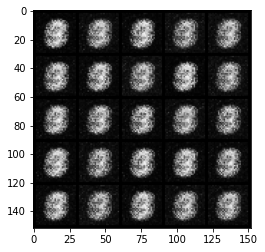

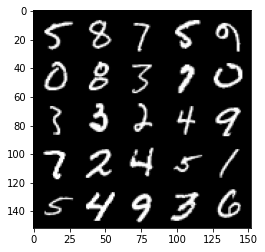

Epoch 2, step 1000: Generator loss: 1.6656208496093736, discriminator loss: 0.30168738490343056


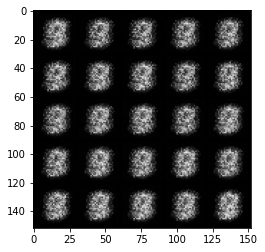

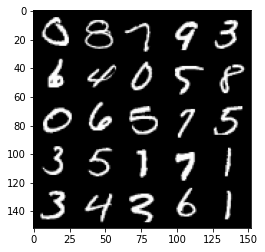

Epoch 3, step 1500: Generator loss: 1.959699041843414, discriminator loss: 0.17518010994791994


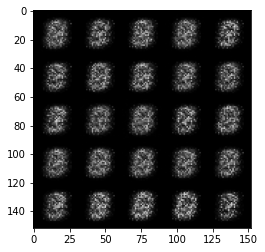

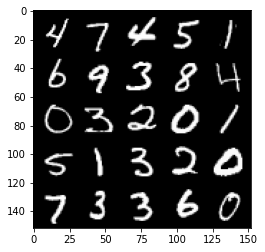

Epoch 4, step 2000: Generator loss: 1.7715747859477997, discriminator loss: 0.1953523062169553


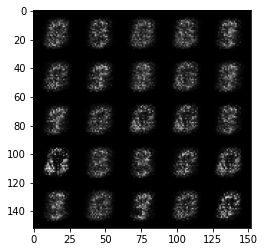

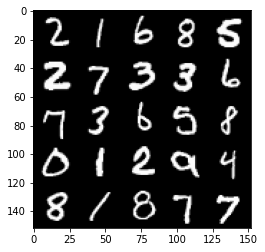

Epoch 5, step 2500: Generator loss: 1.7401976549625404, discriminator loss: 0.19350862839818003


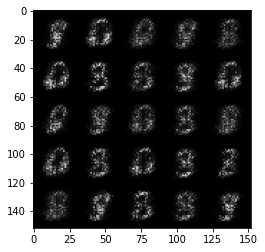

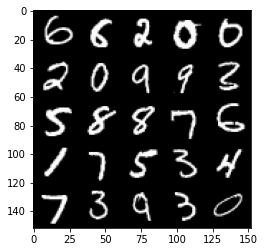

Epoch 6, step 3000: Generator loss: 2.034474889755248, discriminator loss: 0.14797198757529262


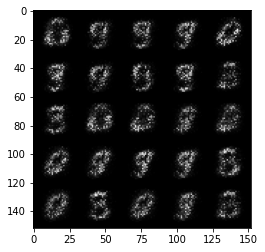

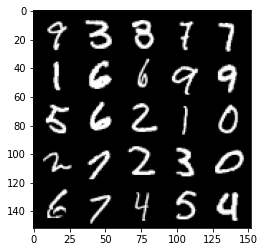

Epoch 7, step 3500: Generator loss: 2.362895199298859, discriminator loss: 0.13513328322768206


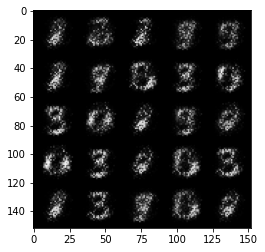

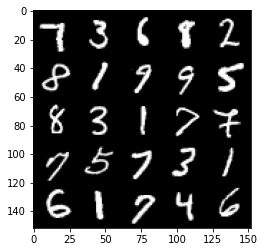

Epoch 8, step 4000: Generator loss: 2.72471982574463, discriminator loss: 0.1199522464126348


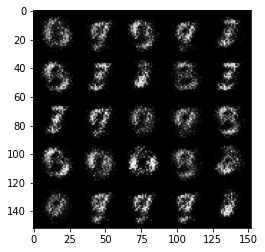

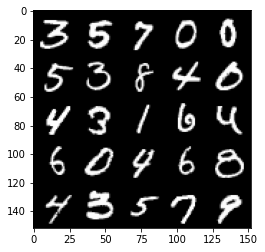

Epoch 9, step 4500: Generator loss: 3.114759280681611, discriminator loss: 0.09922722546756278


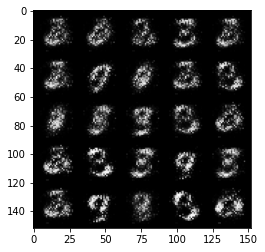

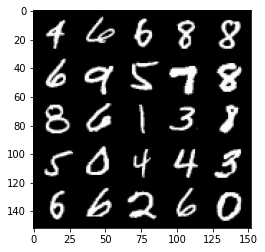

Epoch 10, step 5000: Generator loss: 3.3850073413848913, discriminator loss: 0.0860095743462443


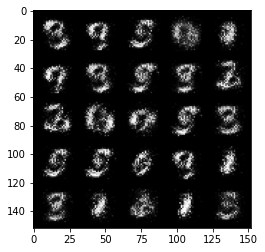

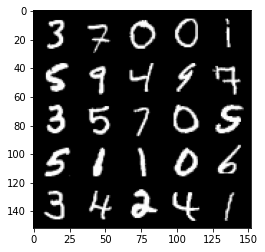

Epoch 11, step 5500: Generator loss: 3.7406442613601674, discriminator loss: 0.0720624757856131


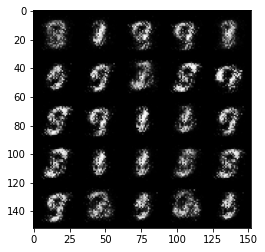

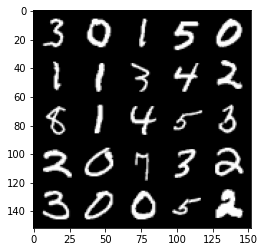

Epoch 12, step 6000: Generator loss: 3.763645399093622, discriminator loss: 0.06992309200018643


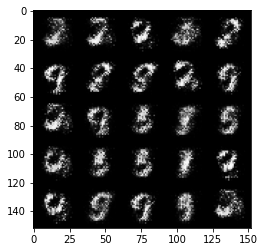

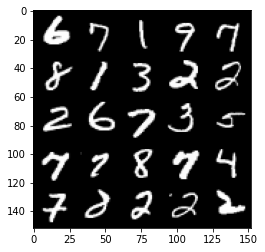

Epoch 13, step 6500: Generator loss: 3.915923435688022, discriminator loss: 0.06019986397027972


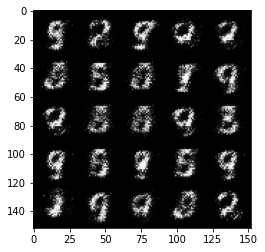

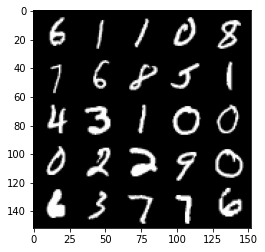

Epoch 14, step 7000: Generator loss: 3.901250327110292, discriminator loss: 0.05420380865037445


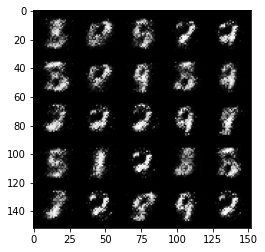

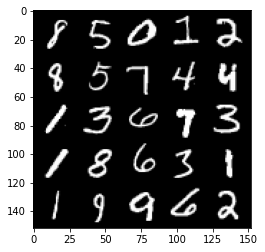

Epoch 15, step 7500: Generator loss: 4.281853377819057, discriminator loss: 0.04703892482072113


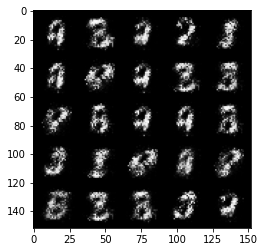

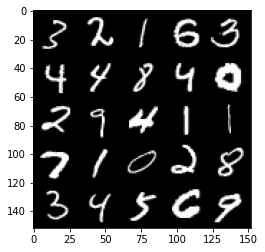

Epoch 17, step 8000: Generator loss: 4.3244413847923235, discriminator loss: 0.04739906970039017


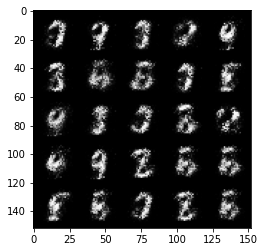

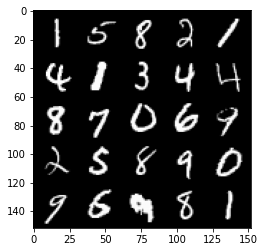

Epoch 18, step 8500: Generator loss: 4.0416179738044695, discriminator loss: 0.0557373558916152


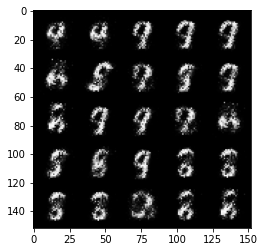

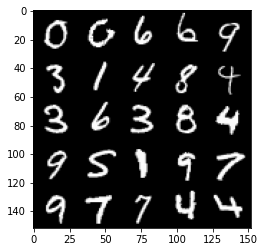

Epoch 19, step 9000: Generator loss: 3.9860695691108763, discriminator loss: 0.0603864609338343


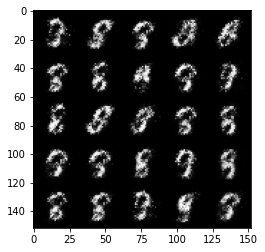

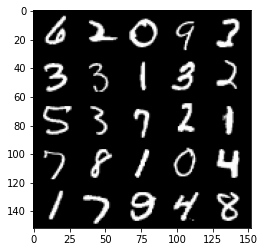

Epoch 20, step 9500: Generator loss: 3.9870626630783077, discriminator loss: 0.06285879225283854


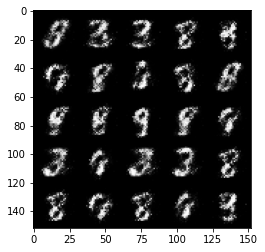

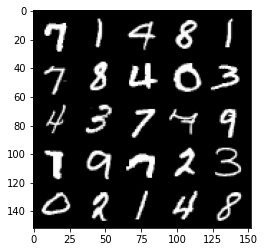

Epoch 21, step 10000: Generator loss: 3.964523260593413, discriminator loss: 0.06476203906536096


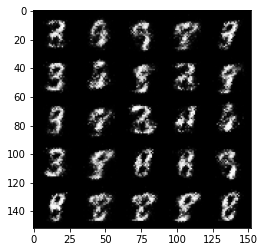

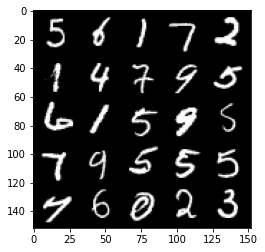

Epoch 22, step 10500: Generator loss: 4.021877134799958, discriminator loss: 0.07118775824829936


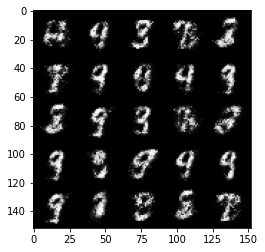

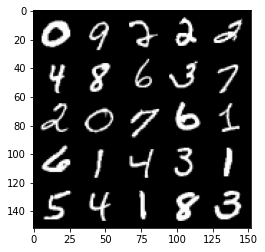

Epoch 23, step 11000: Generator loss: 3.8272250728607196, discriminator loss: 0.0723931674957275


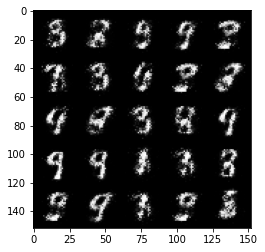

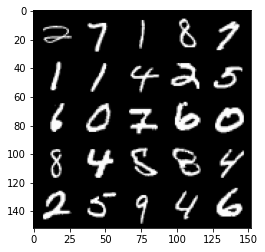

Epoch 24, step 11500: Generator loss: 4.015609654903413, discriminator loss: 0.06703656042367225


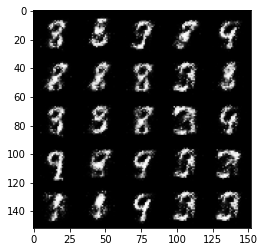

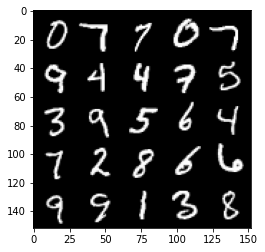

Epoch 25, step 12000: Generator loss: 3.9486224551200886, discriminator loss: 0.07168958156555888


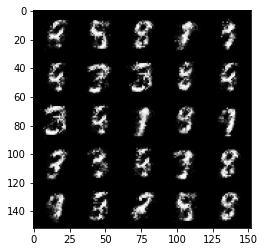

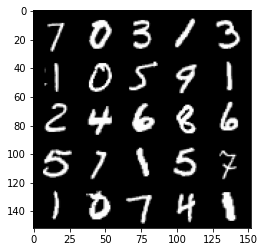

Epoch 26, step 12500: Generator loss: 3.7910015153884866, discriminator loss: 0.0878358604833484


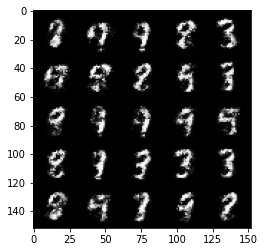

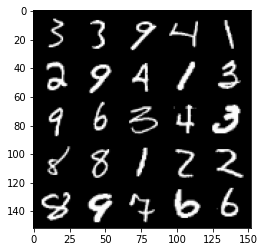

Epoch 27, step 13000: Generator loss: 3.777864474296572, discriminator loss: 0.08012547584623093


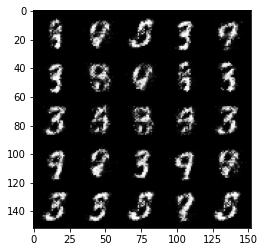

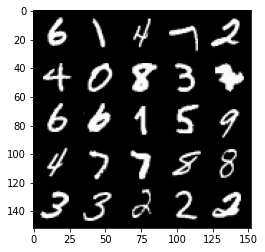

Epoch 28, step 13500: Generator loss: 3.6592501568794225, discriminator loss: 0.09746648921817547


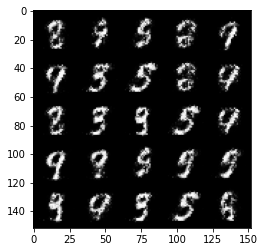

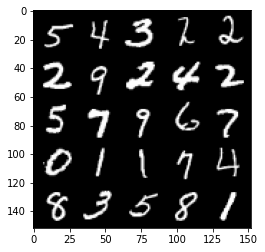

Epoch 29, step 14000: Generator loss: 3.7825606522560147, discriminator loss: 0.09938368567079303


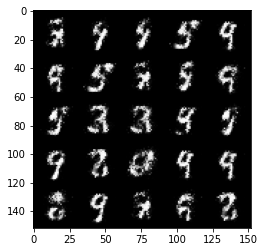

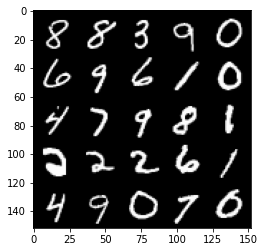

Epoch 30, step 14500: Generator loss: 3.8107346363067625, discriminator loss: 0.09484241073578603


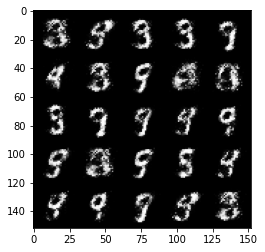

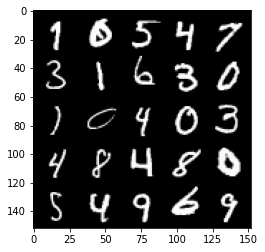

Epoch 31, step 15000: Generator loss: 3.7268335366249112, discriminator loss: 0.1011821422204375


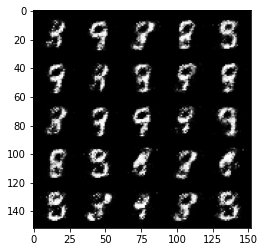

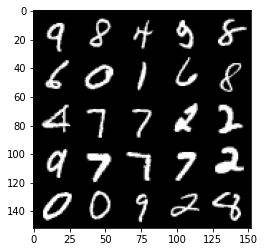

Epoch 33, step 15500: Generator loss: 3.9924023780822733, discriminator loss: 0.0956116464361547


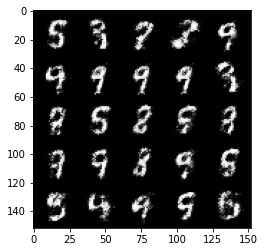

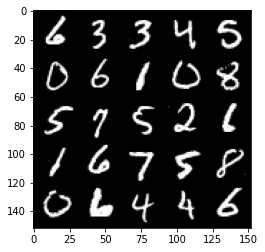

Epoch 34, step 16000: Generator loss: 3.6385223603248624, discriminator loss: 0.11304377087950701


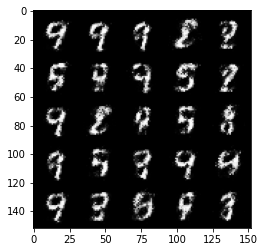

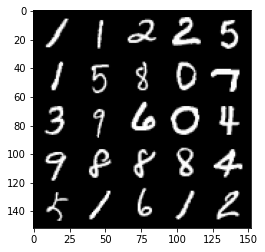

Epoch 35, step 16500: Generator loss: 3.4727613887786872, discriminator loss: 0.12834413372725254


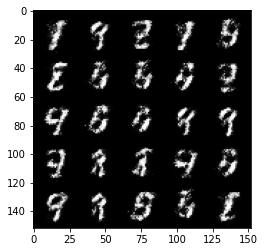

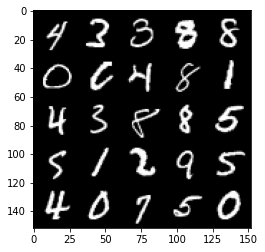

Epoch 36, step 17000: Generator loss: 3.7321671338081344, discriminator loss: 0.12215159611403945


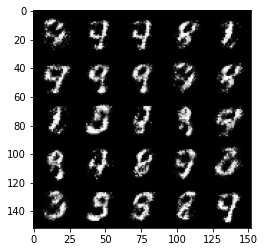

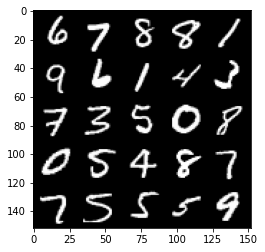

Epoch 37, step 17500: Generator loss: 3.522263244152068, discriminator loss: 0.12465738530457025


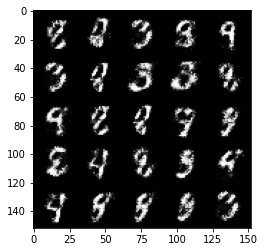

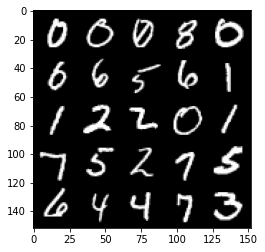

Epoch 38, step 18000: Generator loss: 3.6823478846549973, discriminator loss: 0.11668434918671848


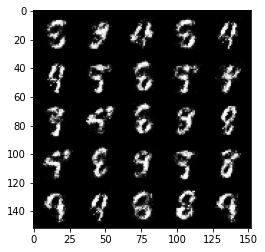

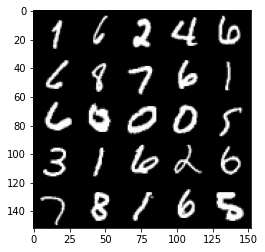

Epoch 39, step 18500: Generator loss: 3.5074971342086765, discriminator loss: 0.1389709129109979


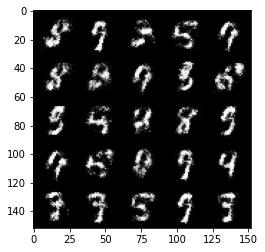

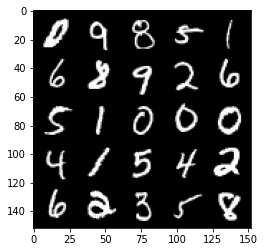

Epoch 40, step 19000: Generator loss: 3.65497400903702, discriminator loss: 0.12867631265521054


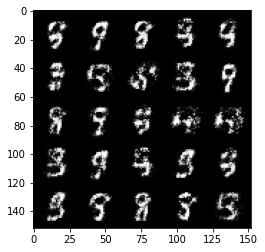

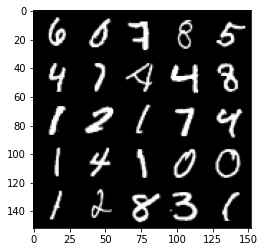

Epoch 41, step 19500: Generator loss: 3.5559811596870423, discriminator loss: 0.13489814400672903


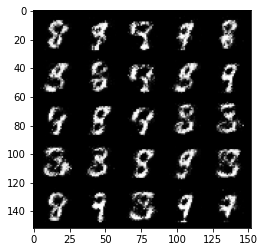

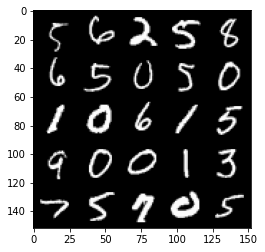

Epoch 42, step 20000: Generator loss: 3.402830703258516, discriminator loss: 0.13570784664154056


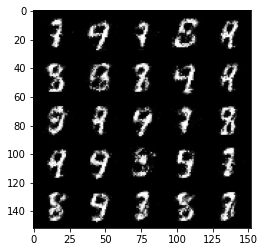

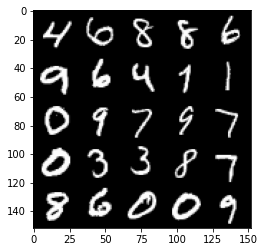

Epoch 43, step 20500: Generator loss: 3.3519078507423385, discriminator loss: 0.13554339414834987


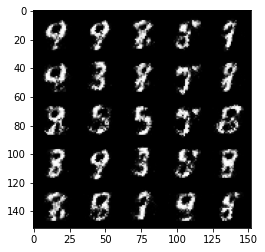

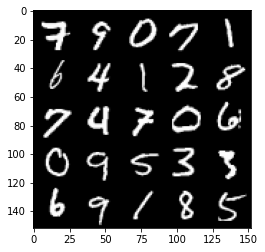

Epoch 44, step 21000: Generator loss: 3.2610827260017374, discriminator loss: 0.14876822276413437


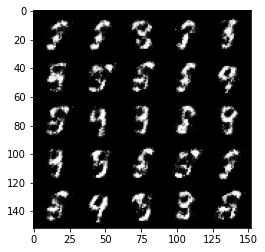

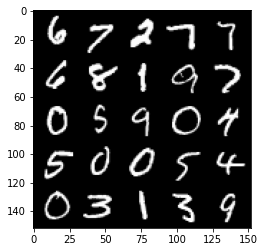

Epoch 45, step 21500: Generator loss: 3.2881321477890015, discriminator loss: 0.13494007855653756


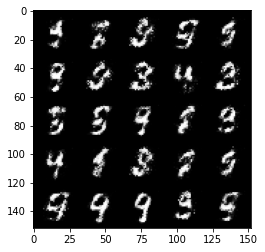

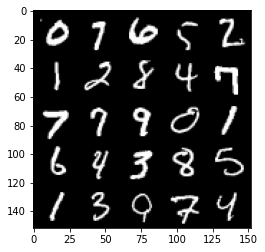

Epoch 46, step 22000: Generator loss: 3.410226386547089, discriminator loss: 0.1417902119159698


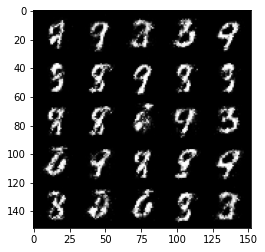

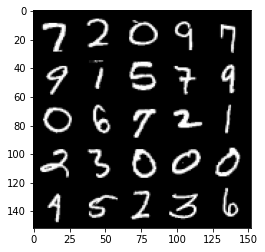

Epoch 47, step 22500: Generator loss: 3.245175023078916, discriminator loss: 0.1609841426610948


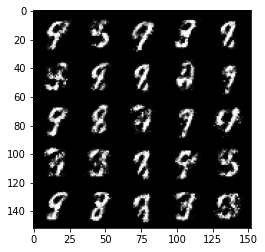

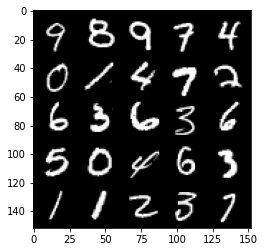

Epoch 49, step 23000: Generator loss: 3.3845624222755433, discriminator loss: 0.13984203645586968


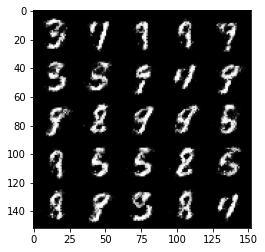

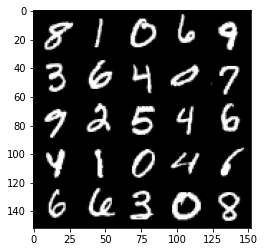

Epoch 50, step 23500: Generator loss: 3.255711233139041, discriminator loss: 0.16373248413205146


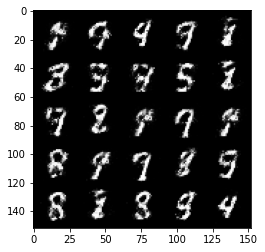

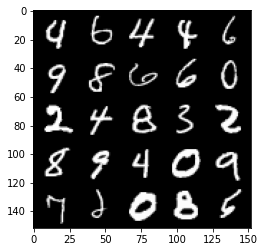

Epoch 51, step 24000: Generator loss: 3.2773969283103948, discriminator loss: 0.17183831758797172


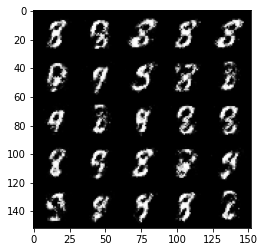

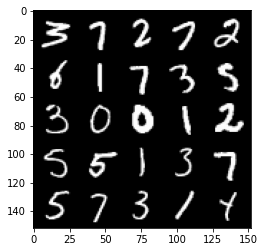

Epoch 52, step 24500: Generator loss: 3.08594402265549, discriminator loss: 0.18312594661116607


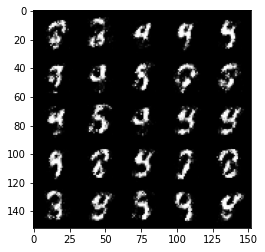

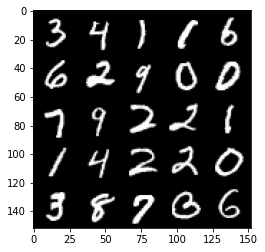

Epoch 53, step 25000: Generator loss: 3.096380111217498, discriminator loss: 0.16138938821852197


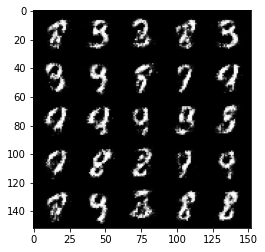

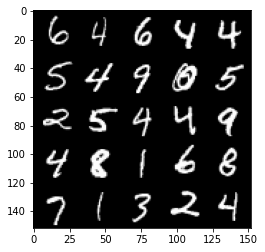

Epoch 54, step 25500: Generator loss: 3.014249667167664, discriminator loss: 0.18246244443953027


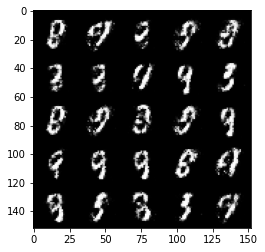

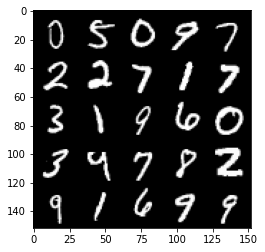

Epoch 55, step 26000: Generator loss: 2.9576573929786685, discriminator loss: 0.18613234794139893


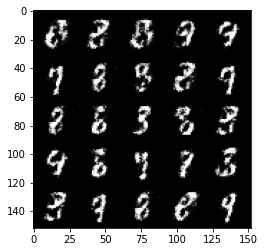

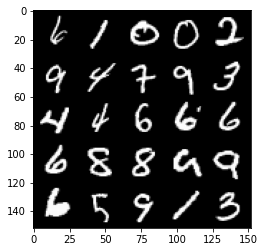

Epoch 56, step 26500: Generator loss: 2.9926590542793265, discriminator loss: 0.17772716800868515


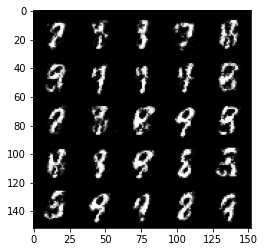

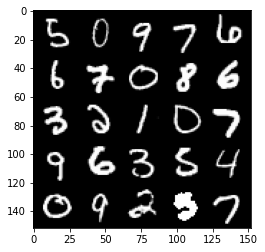

Epoch 57, step 27000: Generator loss: 3.025548767089845, discriminator loss: 0.19849108003079888


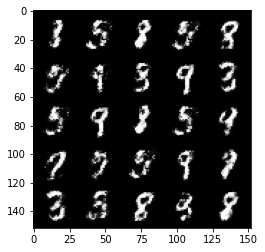

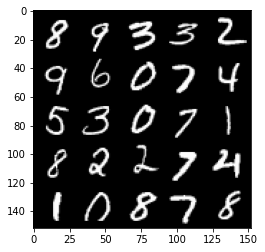

Epoch 58, step 27500: Generator loss: 2.913236177444457, discriminator loss: 0.17486067117750642


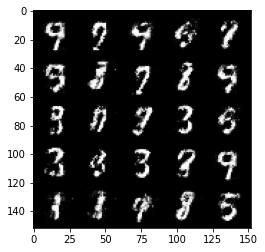

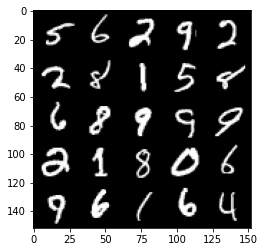

Epoch 59, step 28000: Generator loss: 2.957388055801391, discriminator loss: 0.18141075065732007


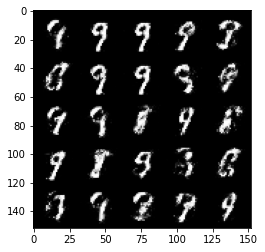

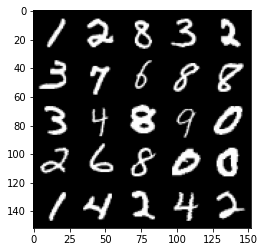

Epoch 60, step 28500: Generator loss: 2.861334796905521, discriminator loss: 0.1976797588169575


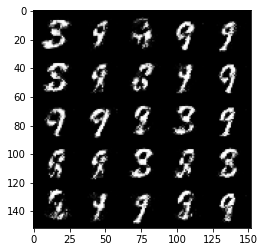

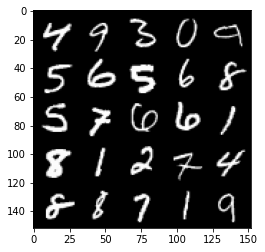

Epoch 61, step 29000: Generator loss: 2.795927355289461, discriminator loss: 0.2236431499123572


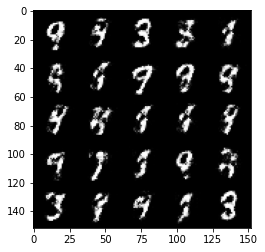

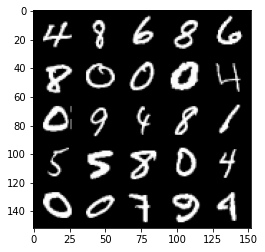

Epoch 62, step 29500: Generator loss: 2.6972514197826376, discriminator loss: 0.22164680221676847


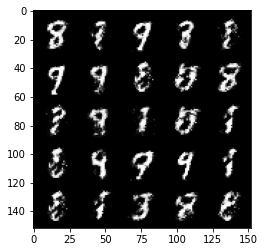

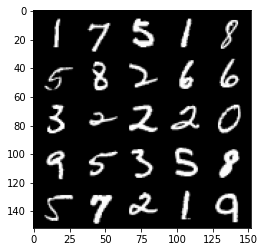

Epoch 63, step 30000: Generator loss: 2.76387561750412, discriminator loss: 0.19892916056513765


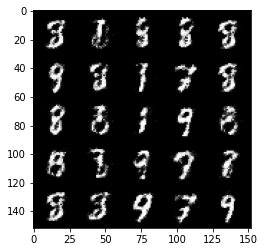

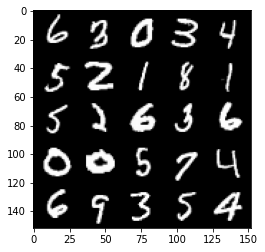

Epoch 65, step 30500: Generator loss: 2.64478324127197, discriminator loss: 0.2217055575847624


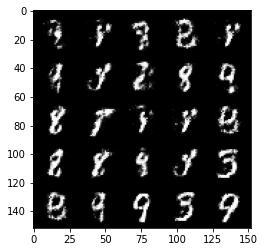

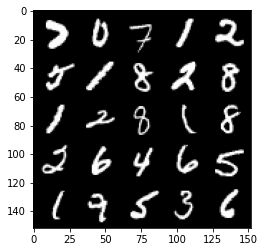

Epoch 66, step 31000: Generator loss: 2.5422088961601257, discriminator loss: 0.2364662801921369


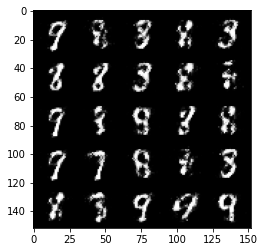

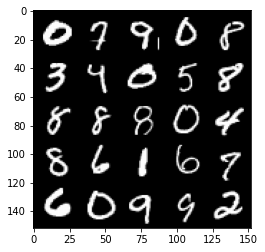

Epoch 67, step 31500: Generator loss: 2.506043346405031, discriminator loss: 0.24573714467883098


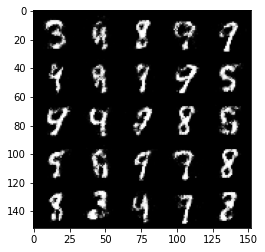

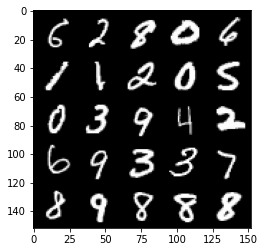

Epoch 68, step 32000: Generator loss: 2.4270512139797202, discriminator loss: 0.2606390921175483


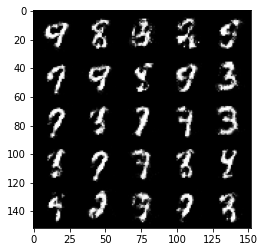

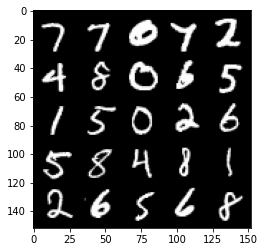

Epoch 69, step 32500: Generator loss: 2.517645916461944, discriminator loss: 0.23793112370371838


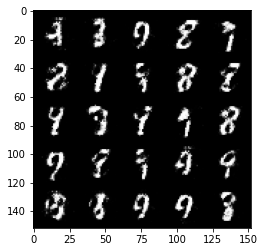

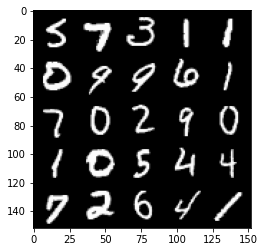

Epoch 70, step 33000: Generator loss: 2.5076740069389336, discriminator loss: 0.2354388225674632


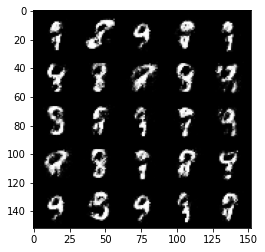

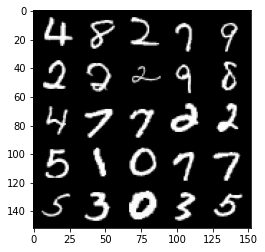

Epoch 71, step 33500: Generator loss: 2.568512510299682, discriminator loss: 0.23495796817541126


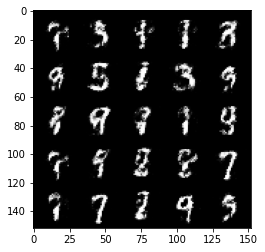

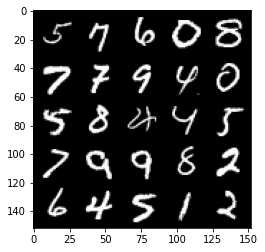

Epoch 72, step 34000: Generator loss: 2.504143301010131, discriminator loss: 0.2385549190938472


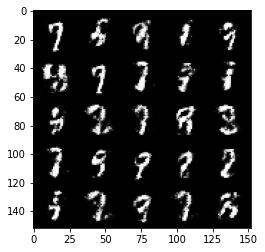

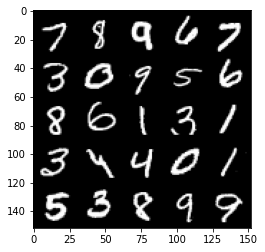

Epoch 73, step 34500: Generator loss: 2.480264189958571, discriminator loss: 0.24588403522968288


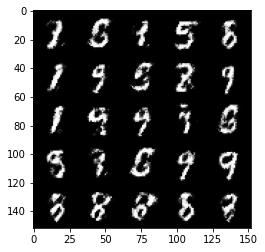

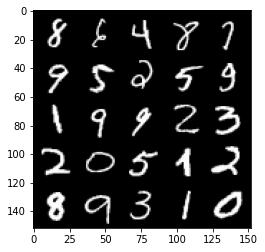

Epoch 74, step 35000: Generator loss: 2.4651585497856137, discriminator loss: 0.24139387404918664


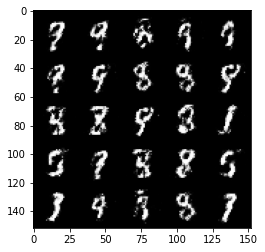

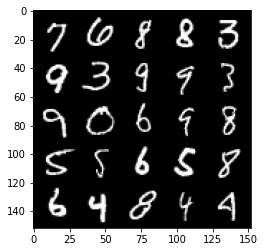

Epoch 75, step 35500: Generator loss: 2.3680035858154302, discriminator loss: 0.259417631447315


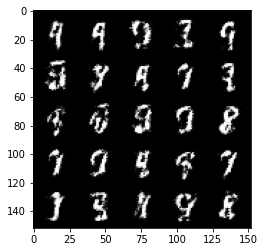

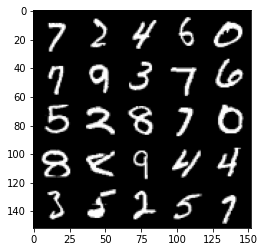

Epoch 76, step 36000: Generator loss: 2.399810719966889, discriminator loss: 0.251323173969984


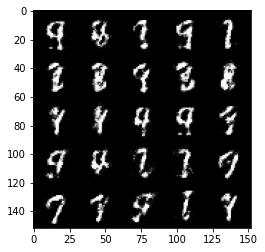

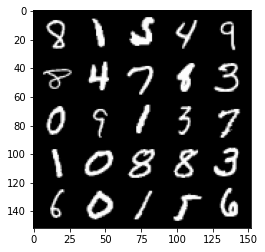

Epoch 77, step 36500: Generator loss: 2.4503672277927437, discriminator loss: 0.24651507905125605


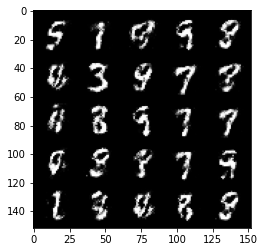

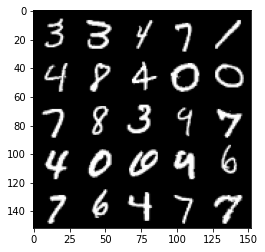

Epoch 78, step 37000: Generator loss: 2.4249154658317544, discriminator loss: 0.2674628692269327


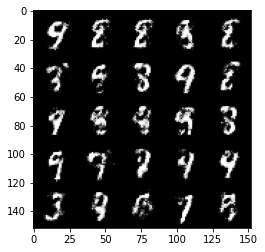

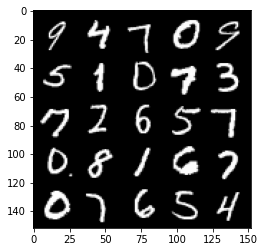

Epoch 79, step 37500: Generator loss: 2.295478756427765, discriminator loss: 0.28171035376191117


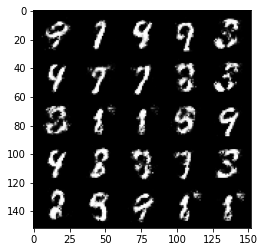

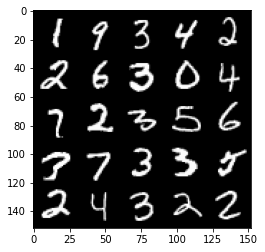

Epoch 81, step 38000: Generator loss: 2.1621396546363836, discriminator loss: 0.300887895733118


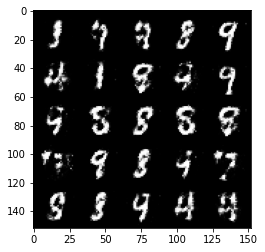

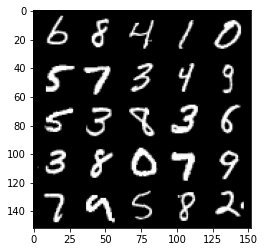

Epoch 82, step 38500: Generator loss: 2.1137565524578097, discriminator loss: 0.3090517679750919


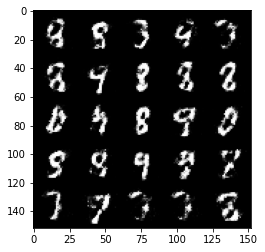

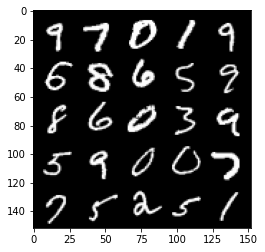

Epoch 83, step 39000: Generator loss: 2.283858239173888, discriminator loss: 0.26851713696122154


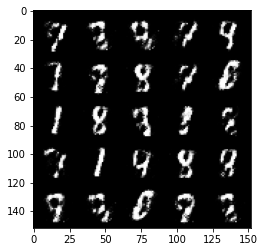

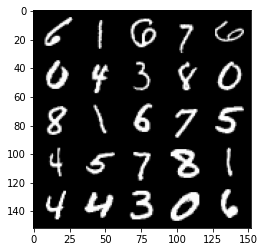

Epoch 84, step 39500: Generator loss: 2.1872639014720927, discriminator loss: 0.28199804091453534


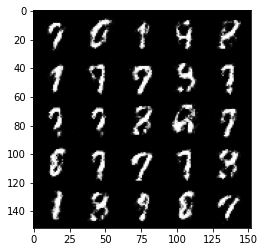

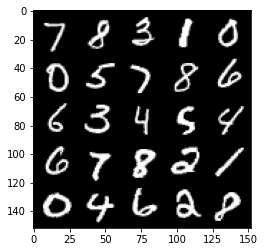

Epoch 85, step 40000: Generator loss: 2.218799647092818, discriminator loss: 0.2802479603886601


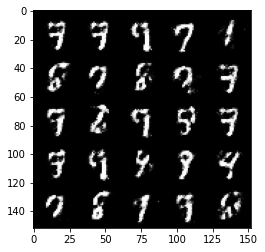

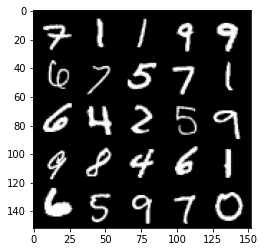

Epoch 86, step 40500: Generator loss: 2.246209153890611, discriminator loss: 0.2806142750084398


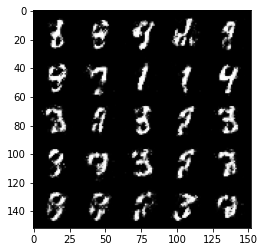

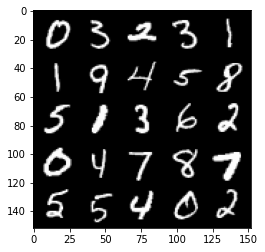

Epoch 87, step 41000: Generator loss: 2.1331513223648066, discriminator loss: 0.30902165725827213


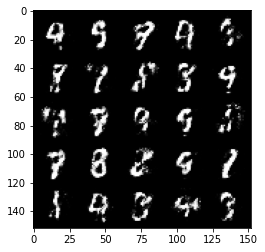

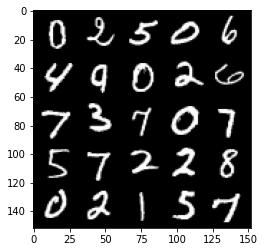

Epoch 88, step 41500: Generator loss: 2.1859262096881866, discriminator loss: 0.29241962340474137


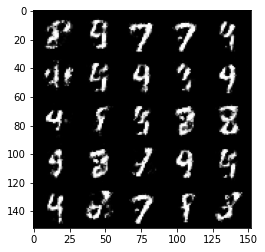

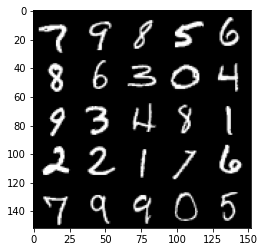

Epoch 89, step 42000: Generator loss: 2.1547799081802363, discriminator loss: 0.30418594115972514


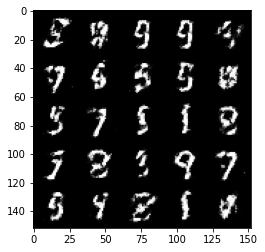

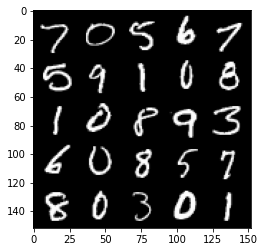

Epoch 90, step 42500: Generator loss: 2.2527950837612147, discriminator loss: 0.28047135734558115


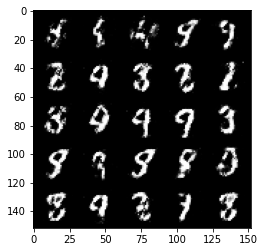

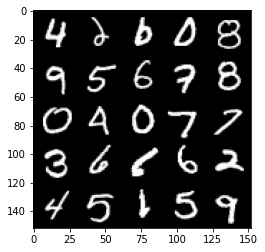

Epoch 91, step 43000: Generator loss: 2.0967854475975045, discriminator loss: 0.31813089829683305


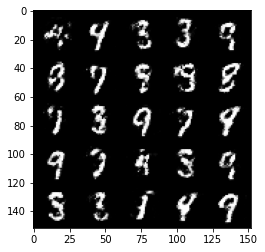

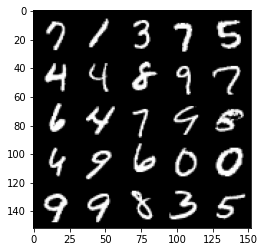

Epoch 92, step 43500: Generator loss: 1.9997346453666691, discriminator loss: 0.32620721700787564


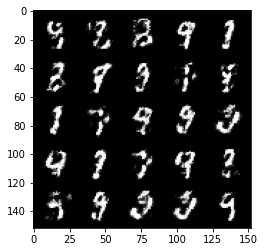

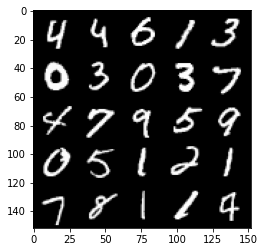

Epoch 93, step 44000: Generator loss: 2.1106320919990536, discriminator loss: 0.2958932488560674


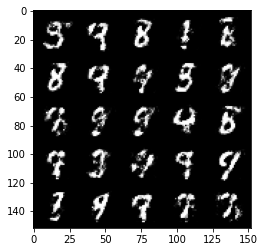

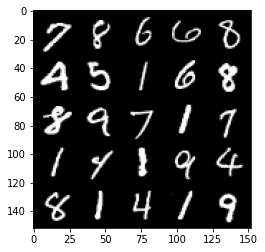

Epoch 94, step 44500: Generator loss: 2.1835043635368345, discriminator loss: 0.2847312310338019


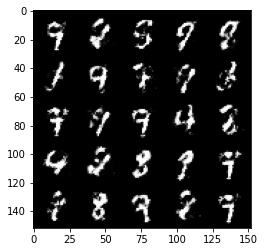

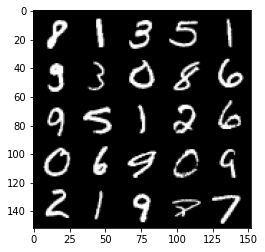

Epoch 95, step 45000: Generator loss: 2.1453234965801258, discriminator loss: 0.2883787164390086


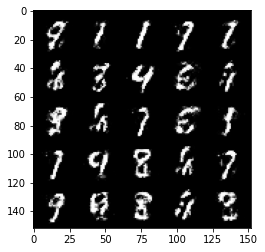

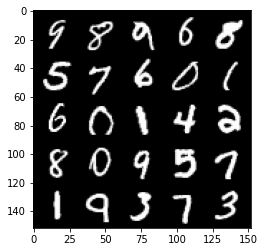

Epoch 97, step 45500: Generator loss: 2.0612841181755073, discriminator loss: 0.3007289368808271


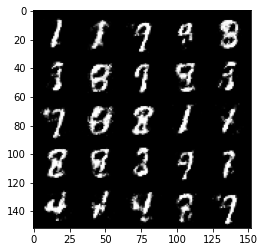

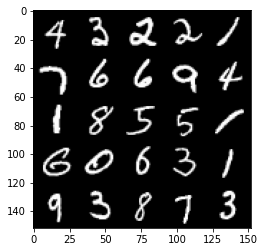

Epoch 98, step 46000: Generator loss: 2.009521524190901, discriminator loss: 0.3186731713712214


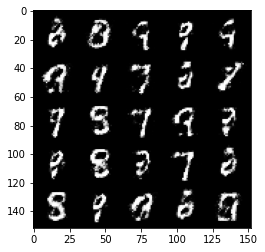

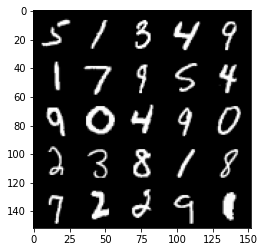

Epoch 99, step 46500: Generator loss: 1.9878205583095545, discriminator loss: 0.3316872268915177


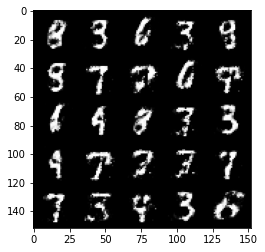

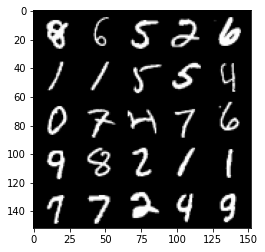

Epoch 100, step 47000: Generator loss: 2.1026506674289727, discriminator loss: 0.29269988727569585


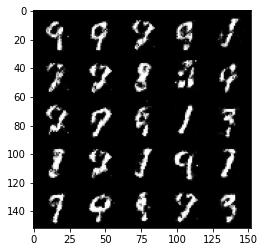

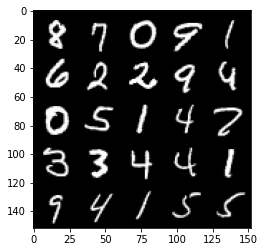

Epoch 101, step 47500: Generator loss: 2.0865382602214835, discriminator loss: 0.29852246785163855


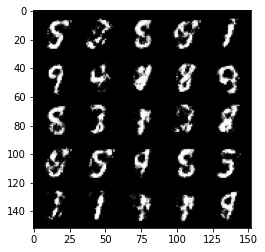

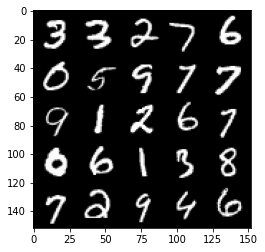

Epoch 102, step 48000: Generator loss: 1.9934345140457153, discriminator loss: 0.319747410476208


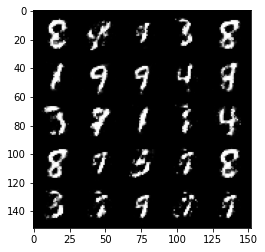

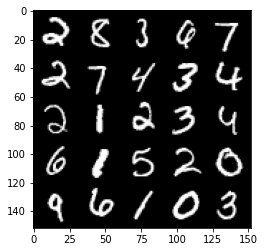

Epoch 103, step 48500: Generator loss: 2.215570915937422, discriminator loss: 0.2718276112079621


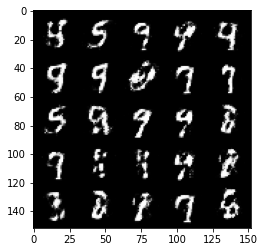

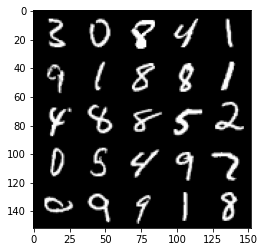

Epoch 104, step 49000: Generator loss: 2.071576546907424, discriminator loss: 0.3112664358317852


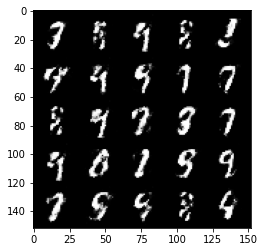

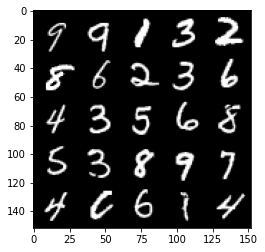

Epoch 105, step 49500: Generator loss: 1.9836070313453669, discriminator loss: 0.327120718628168


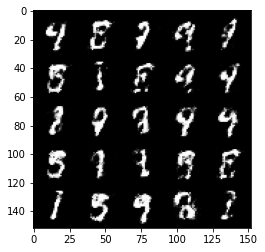

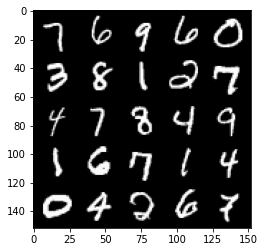

Epoch 106, step 50000: Generator loss: 2.06627913069725, discriminator loss: 0.29098762840032566


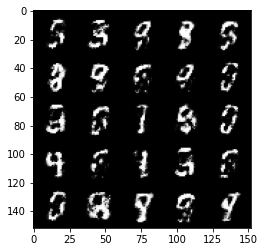

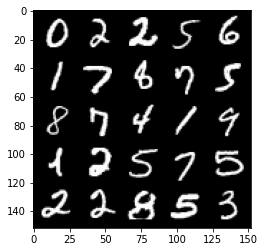

Epoch 107, step 50500: Generator loss: 2.0803207080364223, discriminator loss: 0.2999059912860395


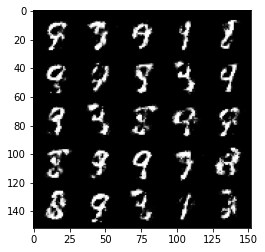

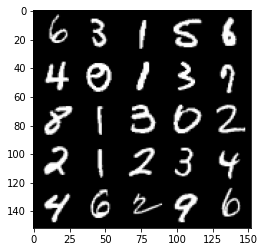

Epoch 108, step 51000: Generator loss: 1.9202580699920653, discriminator loss: 0.3606687434315682


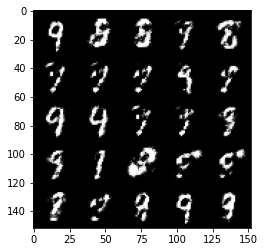

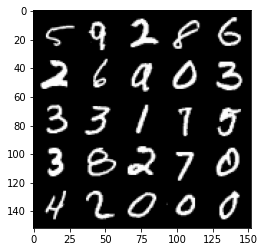

Epoch 109, step 51500: Generator loss: 1.9756597433090208, discriminator loss: 0.3072339755296708


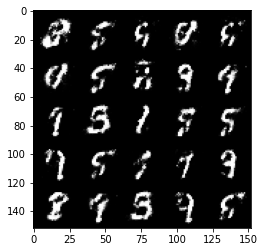

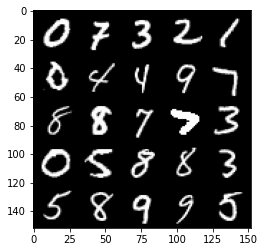

Epoch 110, step 52000: Generator loss: 1.9134662225246433, discriminator loss: 0.3445252332091331


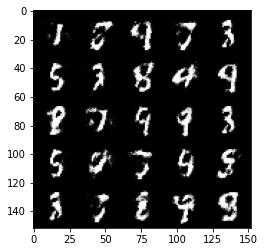

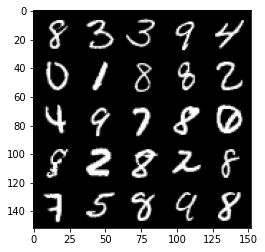

Epoch 111, step 52500: Generator loss: 2.000412392377855, discriminator loss: 0.3318053366839886


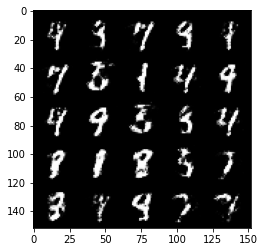

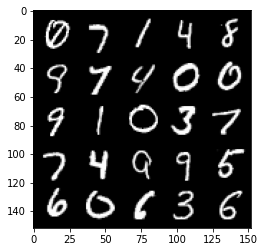

Epoch 113, step 53000: Generator loss: 1.8846726984977724, discriminator loss: 0.3472643931210036


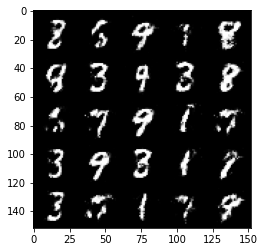

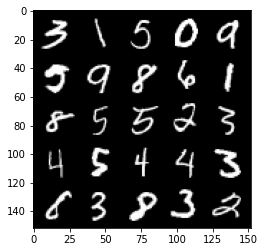

Epoch 114, step 53500: Generator loss: 1.9243575181961066, discriminator loss: 0.31547564345598234


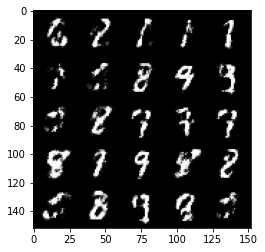

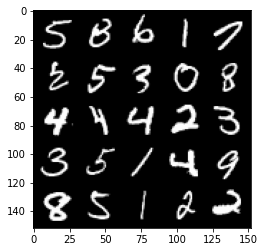

Epoch 115, step 54000: Generator loss: 1.76227307677269, discriminator loss: 0.36151700365543354


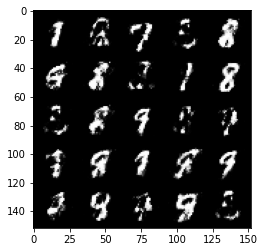

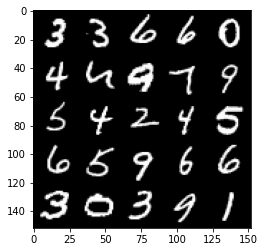

Epoch 116, step 54500: Generator loss: 1.751178361415863, discriminator loss: 0.3570858953595157


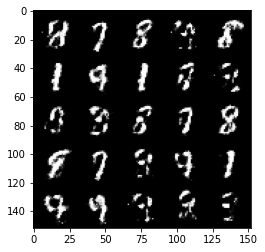

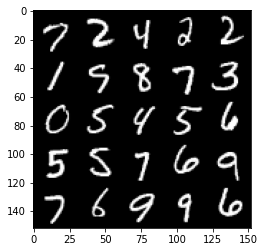

Epoch 117, step 55000: Generator loss: 1.860708168745042, discriminator loss: 0.3393613349497314


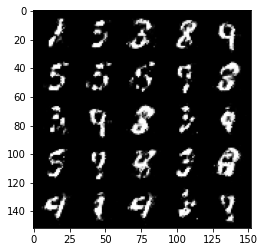

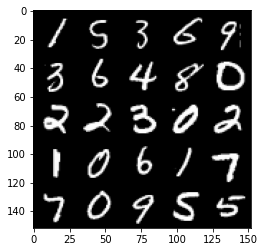

Epoch 118, step 55500: Generator loss: 1.9041389143466947, discriminator loss: 0.34024756246805216


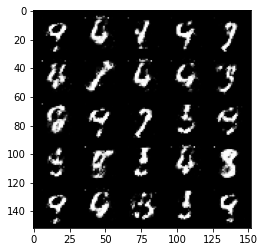

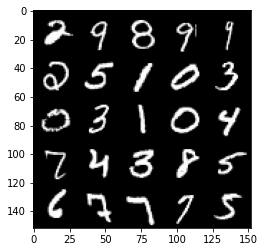

Epoch 119, step 56000: Generator loss: 1.9078442354202263, discriminator loss: 0.3288980048298837


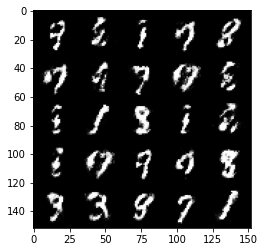

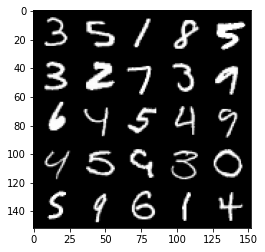

Epoch 120, step 56500: Generator loss: 1.90181668949127, discriminator loss: 0.3327543367147447


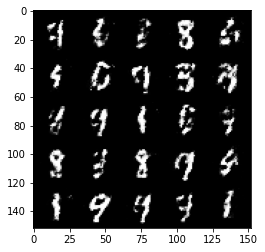

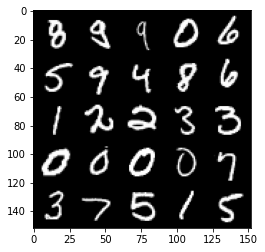

Epoch 121, step 57000: Generator loss: 1.916063701391221, discriminator loss: 0.33361365652084357


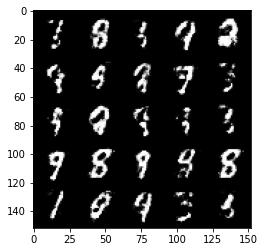

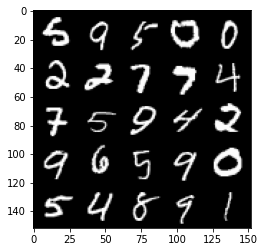

Epoch 122, step 57500: Generator loss: 1.8524254775047315, discriminator loss: 0.3310599236488342


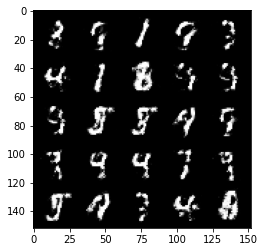

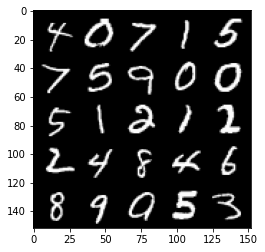

Epoch 123, step 58000: Generator loss: 1.859228138923646, discriminator loss: 0.3448712174296379


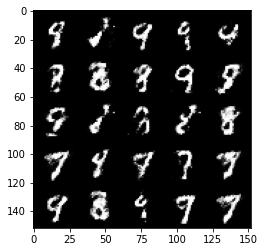

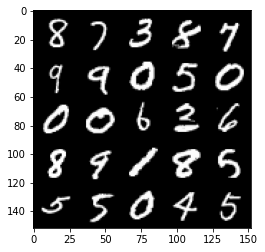

Epoch 124, step 58500: Generator loss: 1.7776148862838737, discriminator loss: 0.3726849602460863


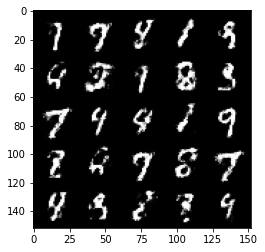

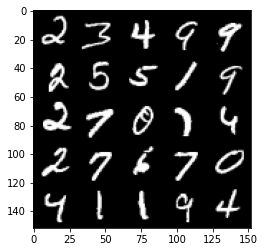

Epoch 125, step 59000: Generator loss: 1.8664619512557972, discriminator loss: 0.34008561044931385


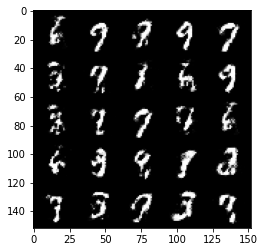

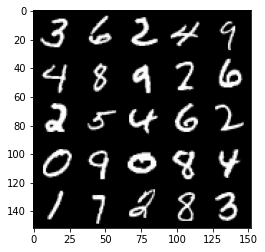

Epoch 126, step 59500: Generator loss: 1.7386420171260824, discriminator loss: 0.3739313322305674


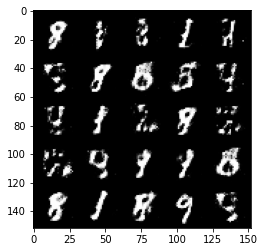

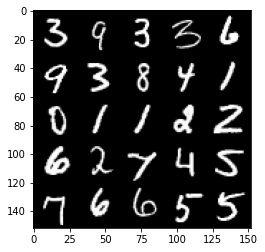

Epoch 127, step 60000: Generator loss: 1.7761220674514775, discriminator loss: 0.35034886446595204


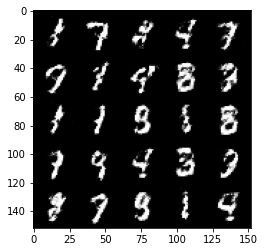

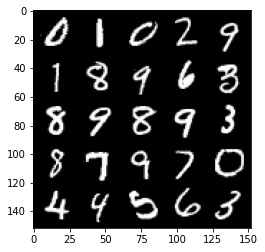

Epoch 128, step 60500: Generator loss: 1.8597844021320324, discriminator loss: 0.3332950624525545


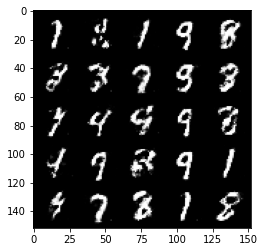

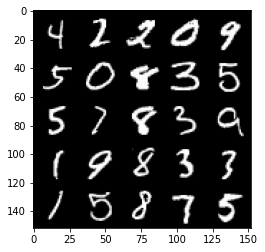

Epoch 130, step 61000: Generator loss: 1.8654738836288443, discriminator loss: 0.34203482902050036


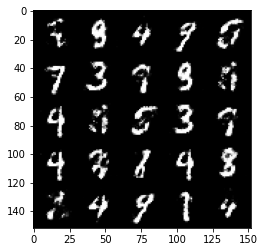

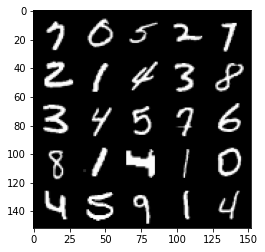

Epoch 131, step 61500: Generator loss: 1.7622640786170956, discriminator loss: 0.3627682774066923


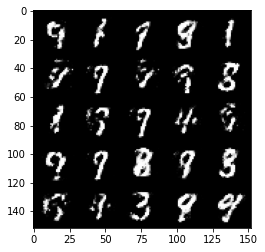

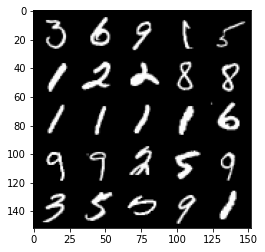

Epoch 132, step 62000: Generator loss: 1.732489598035812, discriminator loss: 0.36434355854988115


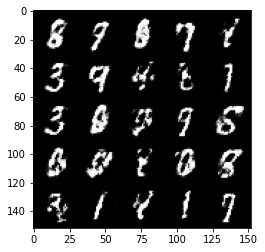

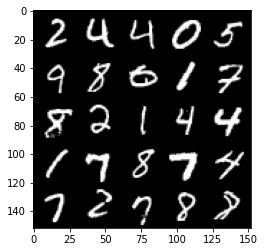

Epoch 133, step 62500: Generator loss: 1.873710921049118, discriminator loss: 0.3294515214562415


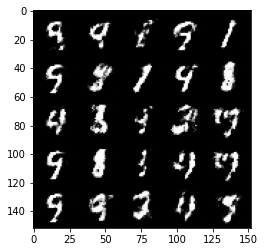

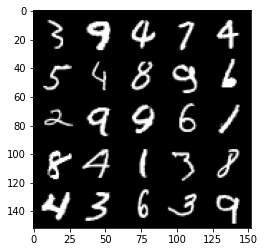

Epoch 134, step 63000: Generator loss: 1.7696231865882874, discriminator loss: 0.3678451877236367


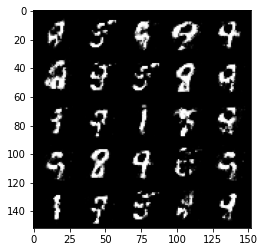

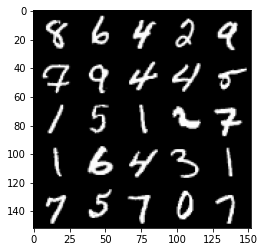

Epoch 135, step 63500: Generator loss: 1.7160572586059544, discriminator loss: 0.3746639467477806


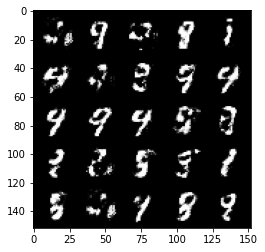

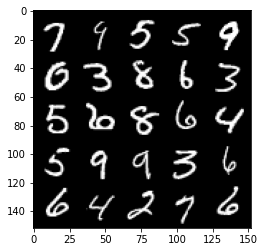

Epoch 136, step 64000: Generator loss: 1.7029804353713978, discriminator loss: 0.39561464053392437


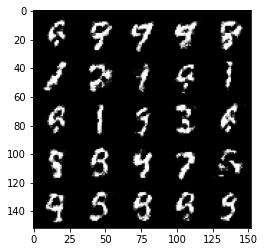

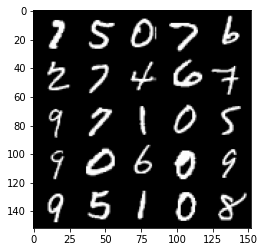

Epoch 137, step 64500: Generator loss: 1.5698821737766266, discriminator loss: 0.4113704888224598


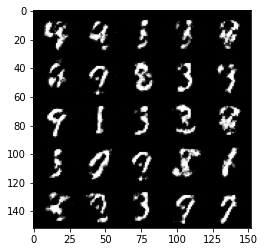

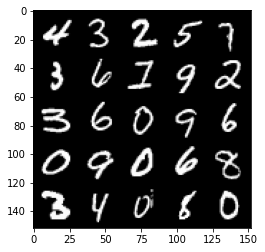

Epoch 138, step 65000: Generator loss: 1.6334501886367787, discriminator loss: 0.3860147075653073


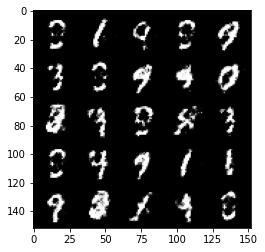

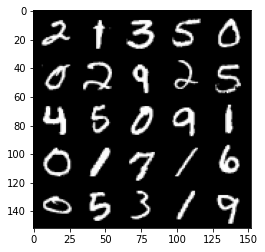

Epoch 139, step 65500: Generator loss: 1.580019245862961, discriminator loss: 0.41921044081449527


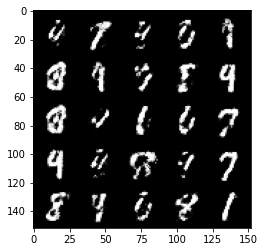

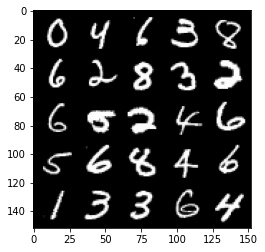

Epoch 140, step 66000: Generator loss: 1.5567756898403164, discriminator loss: 0.40257077091932314


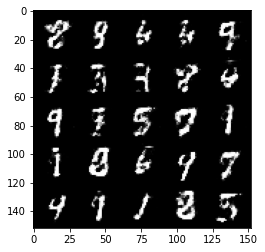

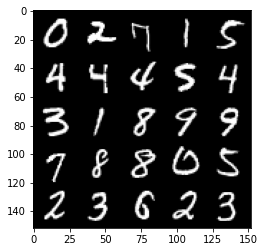

Epoch 141, step 66500: Generator loss: 1.68755432677269, discriminator loss: 0.3733485043048859


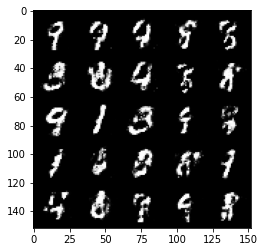

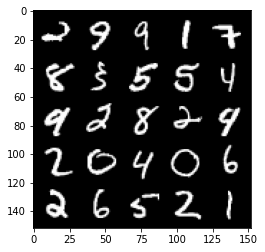

Epoch 142, step 67000: Generator loss: 1.6995985245704641, discriminator loss: 0.3720923105478287


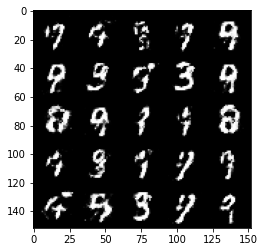

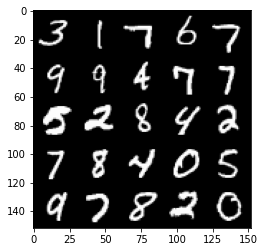

Epoch 143, step 67500: Generator loss: 1.6757619452476509, discriminator loss: 0.3860019426345827


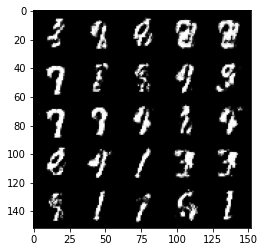

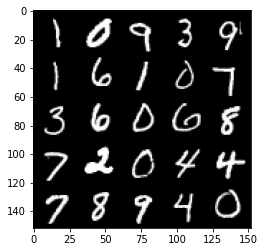

Epoch 144, step 68000: Generator loss: 1.6464573972225196, discriminator loss: 0.39810670119524016


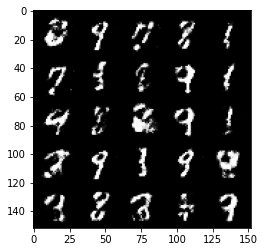

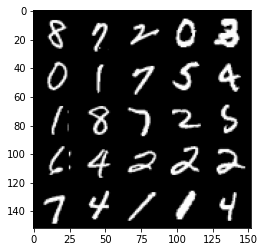

Epoch 146, step 68500: Generator loss: 1.563365426778794, discriminator loss: 0.4047748156785965


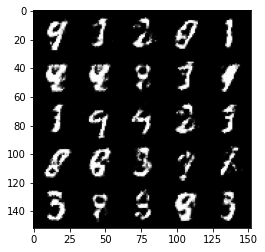

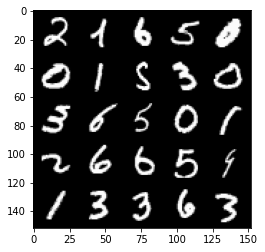

Epoch 147, step 69000: Generator loss: 1.5425306785106652, discriminator loss: 0.4039427983760835


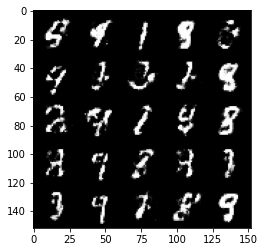

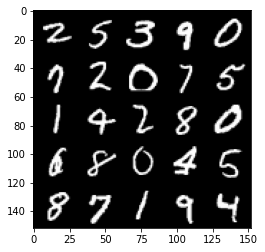

Epoch 148, step 69500: Generator loss: 1.5135083622932444, discriminator loss: 0.4273817414641383


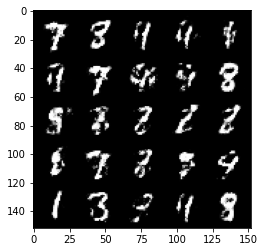

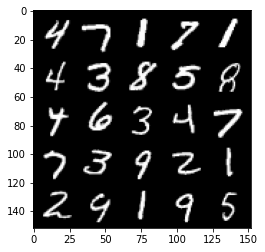

Epoch 149, step 70000: Generator loss: 1.537458117246628, discriminator loss: 0.42218551504611984


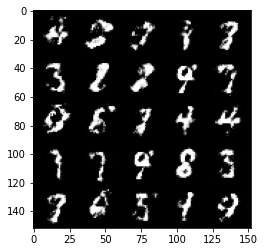

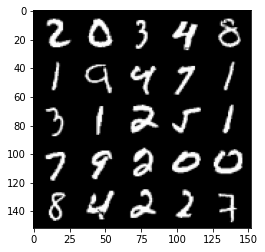

Epoch 150, step 70500: Generator loss: 1.5859329319000246, discriminator loss: 0.3955578504800798


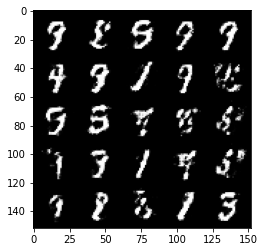

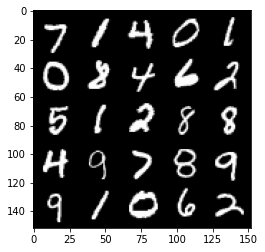

Epoch 151, step 71000: Generator loss: 1.6238230361938475, discriminator loss: 0.39391873401403443


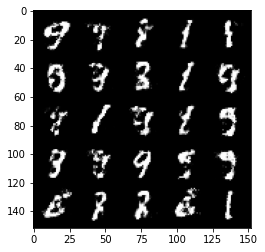

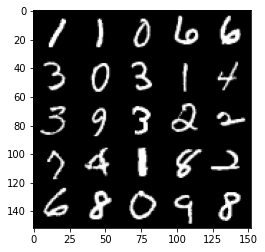

Epoch 152, step 71500: Generator loss: 1.6605083246231067, discriminator loss: 0.38448281782865523


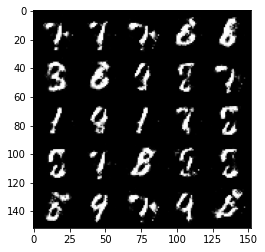

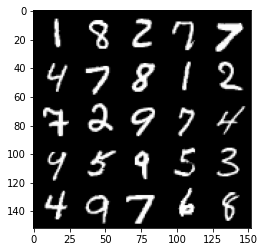

Epoch 153, step 72000: Generator loss: 1.622416234493256, discriminator loss: 0.39963780766725515


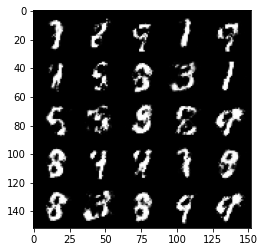

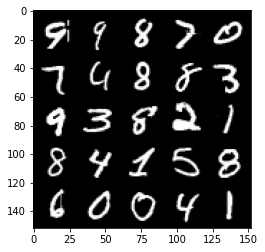

Epoch 154, step 72500: Generator loss: 1.548811036586761, discriminator loss: 0.4021914837360385


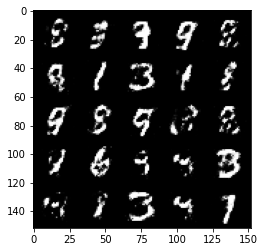

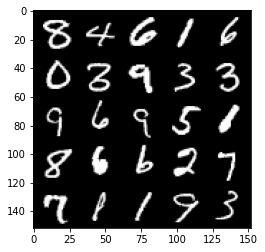

Epoch 155, step 73000: Generator loss: 1.4806341145038593, discriminator loss: 0.43399889957904836


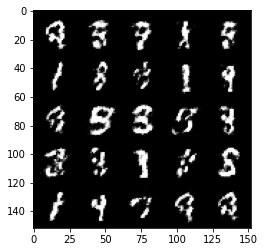

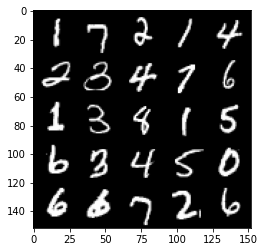

Epoch 156, step 73500: Generator loss: 1.5393112688064574, discriminator loss: 0.4043772398829458


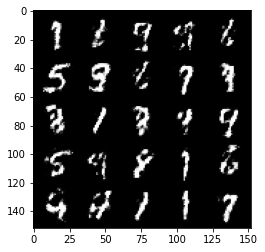

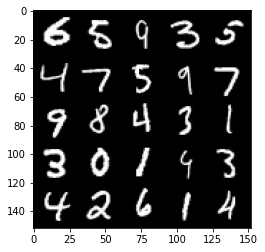

Epoch 157, step 74000: Generator loss: 1.4989011552333822, discriminator loss: 0.4294496794342994


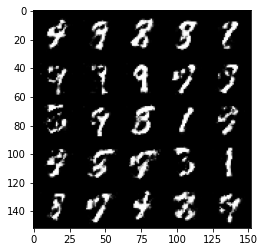

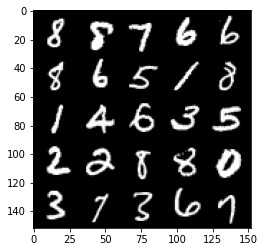

Epoch 158, step 74500: Generator loss: 1.50663003873825, discriminator loss: 0.4155858868956562


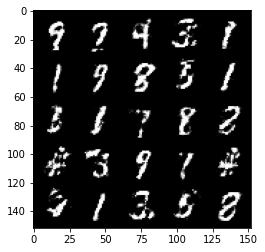

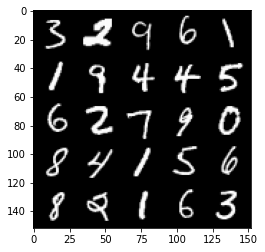

Epoch 159, step 75000: Generator loss: 1.442416973114014, discriminator loss: 0.44310558462142946


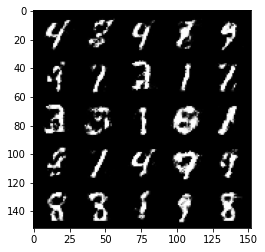

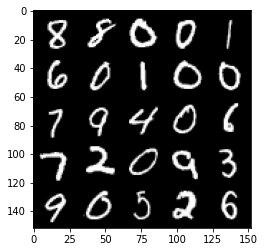

Epoch 160, step 75500: Generator loss: 1.4997235345840458, discriminator loss: 0.4217792710661888


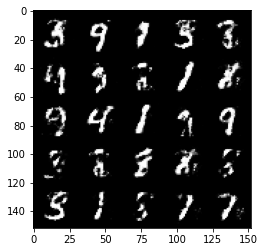

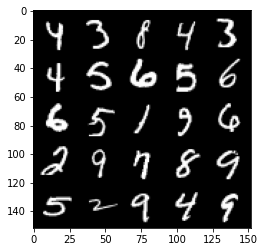

Epoch 162, step 76000: Generator loss: 1.487022975921631, discriminator loss: 0.4169625528454782


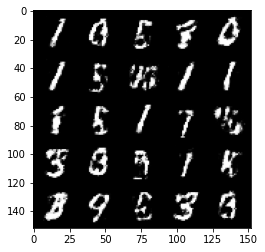

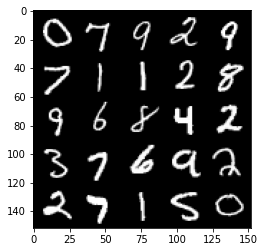

Epoch 163, step 76500: Generator loss: 1.496162166357039, discriminator loss: 0.4207874639034267


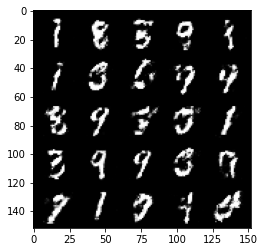

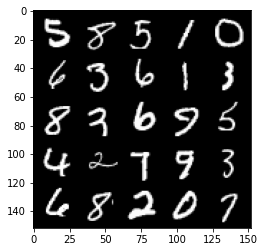

Epoch 164, step 77000: Generator loss: 1.4703646214008321, discriminator loss: 0.4363954168558121


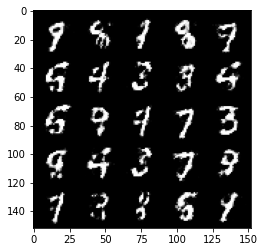

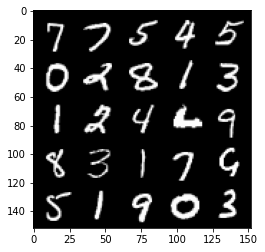

Epoch 165, step 77500: Generator loss: 1.5073288521766675, discriminator loss: 0.407925023853779


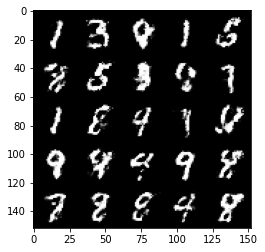

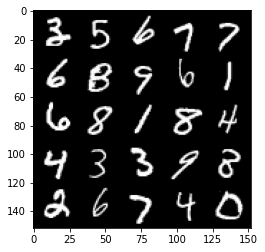

Epoch 166, step 78000: Generator loss: 1.5457555956840516, discriminator loss: 0.40755764454603194


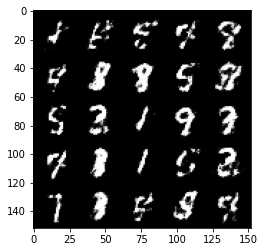

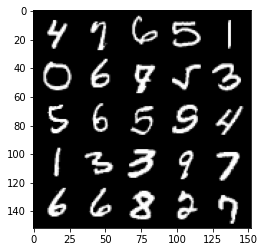

Epoch 167, step 78500: Generator loss: 1.445595161914824, discriminator loss: 0.43764180248975715


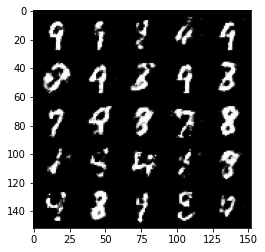

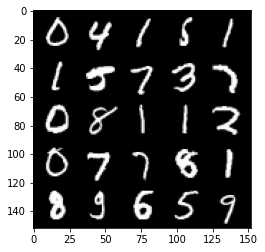

Epoch 168, step 79000: Generator loss: 1.4098366572856902, discriminator loss: 0.43817007511854195


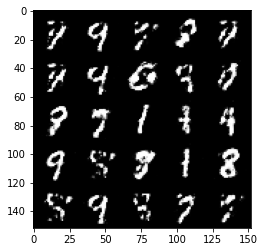

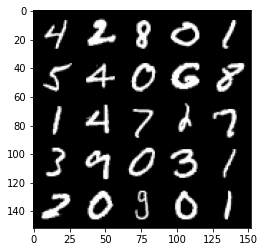

Epoch 169, step 79500: Generator loss: 1.3919505281448354, discriminator loss: 0.4399653308987621


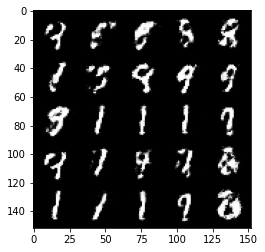

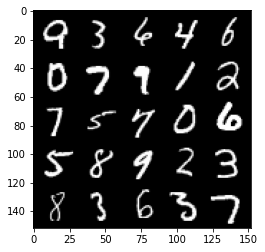

Epoch 170, step 80000: Generator loss: 1.3773205046653745, discriminator loss: 0.46068201732635466


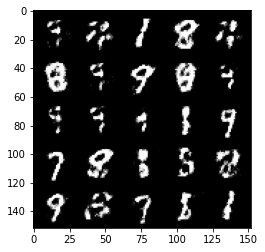

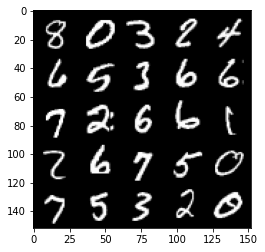

Epoch 171, step 80500: Generator loss: 1.3663287715911865, discriminator loss: 0.4455013765096666


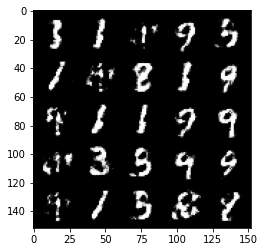

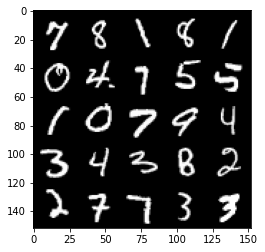

Epoch 172, step 81000: Generator loss: 1.4533541612625112, discriminator loss: 0.4333255909681325


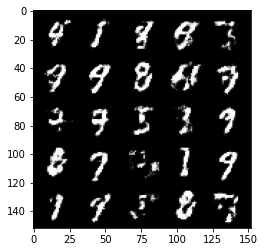

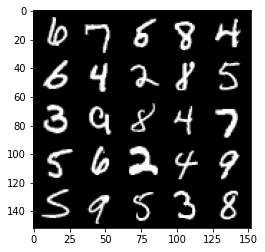

Epoch 173, step 81500: Generator loss: 1.1591644272804256, discriminator loss: 0.5993954507708545


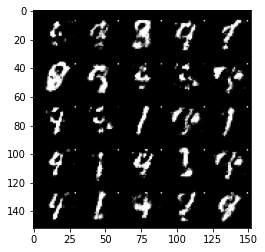

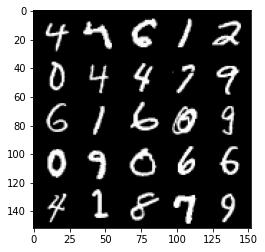

Epoch 174, step 82000: Generator loss: 1.503087810993194, discriminator loss: 0.39512075442075717


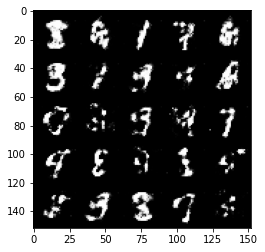

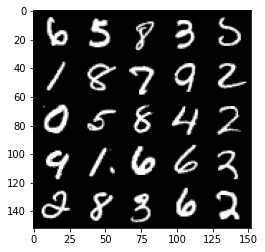

Epoch 175, step 82500: Generator loss: 1.2638099125623707, discriminator loss: 0.5140511531829829


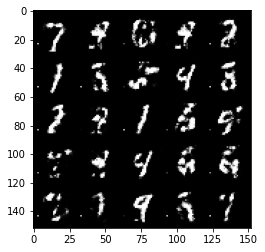

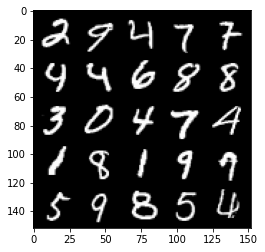

Epoch 176, step 83000: Generator loss: 1.5335942728519443, discriminator loss: 0.40429387944936757


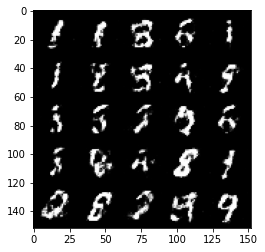

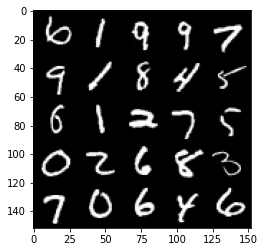

Epoch 178, step 83500: Generator loss: 1.3792364401817299, discriminator loss: 0.45107330536842344


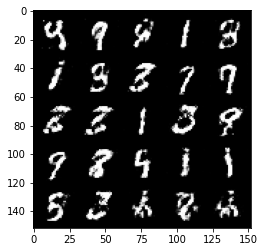

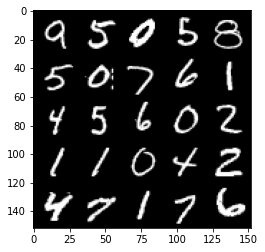

Epoch 179, step 84000: Generator loss: 1.3725072350502021, discriminator loss: 0.45841468769311905


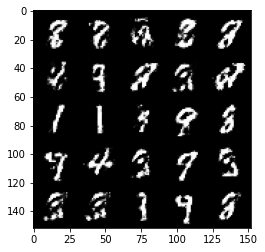

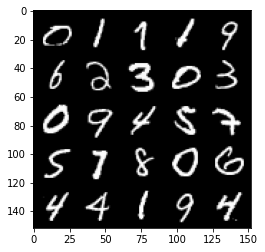

Epoch 180, step 84500: Generator loss: 1.4583260505199436, discriminator loss: 0.4160715820789335


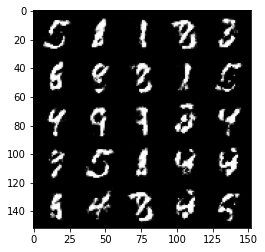

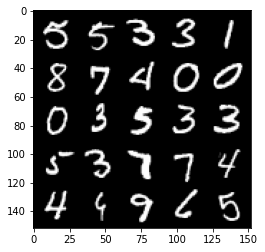

Epoch 181, step 85000: Generator loss: 1.4535454840660103, discriminator loss: 0.423147111475468


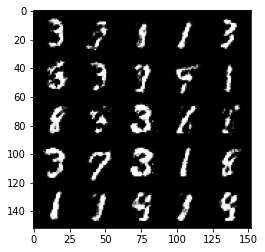

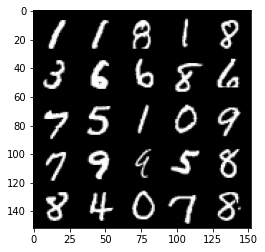

Epoch 182, step 85500: Generator loss: 1.3795730917453763, discriminator loss: 0.4467974164485929


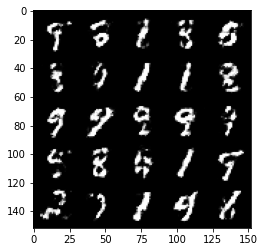

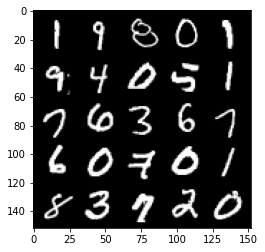

Epoch 183, step 86000: Generator loss: 1.3790535895824445, discriminator loss: 0.44517868638038616


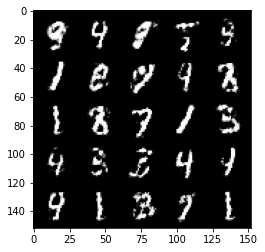

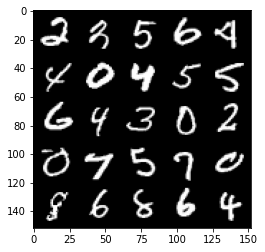

Epoch 184, step 86500: Generator loss: 1.2680773577690105, discriminator loss: 0.4699904477000245


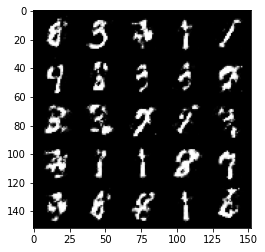

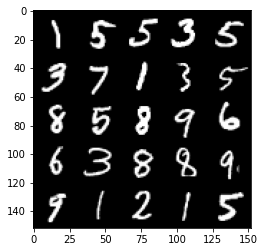

Epoch 185, step 87000: Generator loss: 1.351551809310914, discriminator loss: 0.4555772027969366


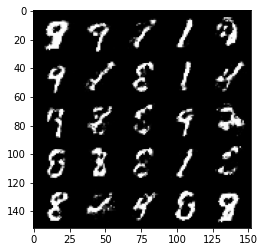

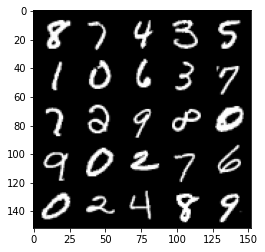

Epoch 186, step 87500: Generator loss: 1.2724994490146635, discriminator loss: 0.4711941174864771


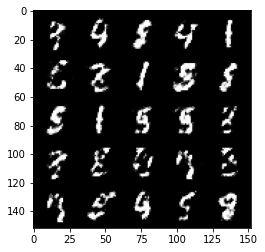

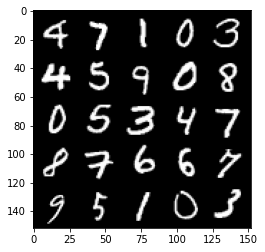

Epoch 187, step 88000: Generator loss: 1.3274916639328003, discriminator loss: 0.4560348949432371


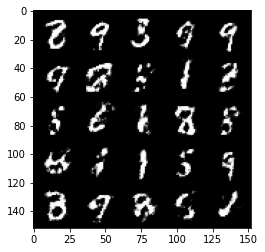

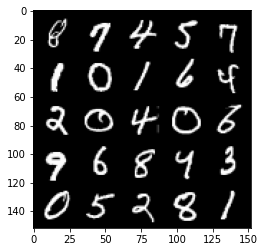

Epoch 188, step 88500: Generator loss: 1.3761062688827508, discriminator loss: 0.45605629336833947


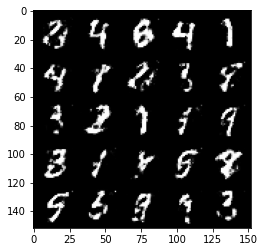

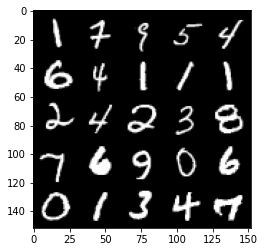

Epoch 189, step 89000: Generator loss: 1.2946599755287171, discriminator loss: 0.4697766490578651


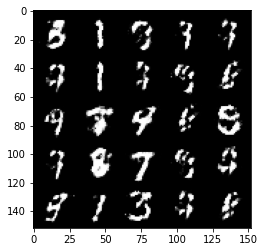

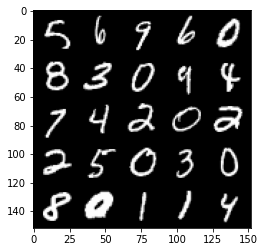

Epoch 190, step 89500: Generator loss: 1.3661296708583828, discriminator loss: 0.44340733397007004


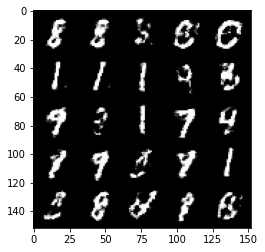

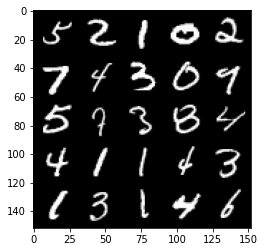

Epoch 191, step 90000: Generator loss: 1.2717263281345352, discriminator loss: 0.4852911100387573


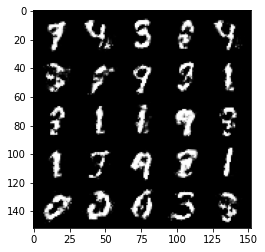

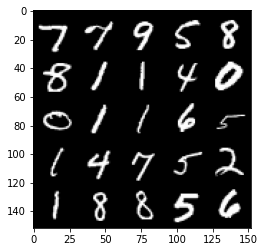

Epoch 192, step 90500: Generator loss: 1.315286501169204, discriminator loss: 0.468288012385369


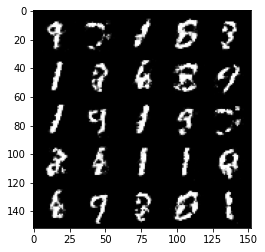

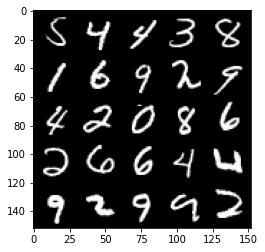

Epoch 194, step 91000: Generator loss: 1.348331172943116, discriminator loss: 0.4512767909169203


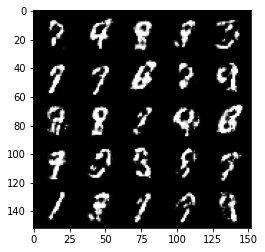

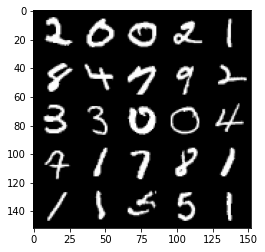

Epoch 195, step 91500: Generator loss: 1.253111696243285, discriminator loss: 0.510047791302204


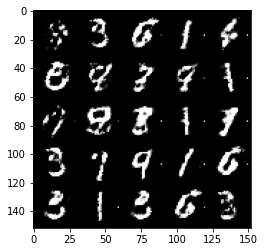

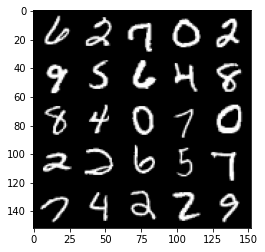

Epoch 196, step 92000: Generator loss: 1.3494737076759324, discriminator loss: 0.4423726585507391


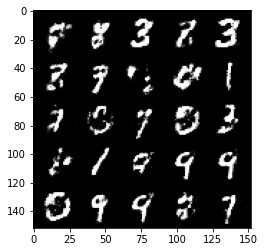

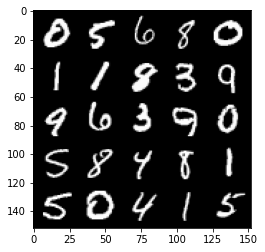

Epoch 197, step 92500: Generator loss: 1.2763701982498163, discriminator loss: 0.47234007543325457


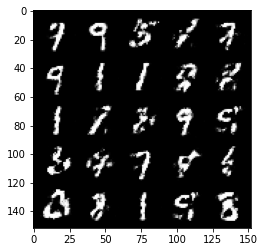

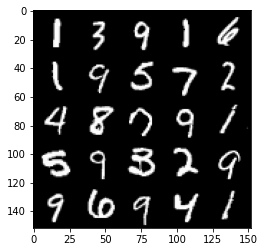

Epoch 198, step 93000: Generator loss: 1.30785394501686, discriminator loss: 0.4803055819272991


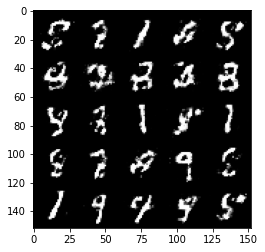

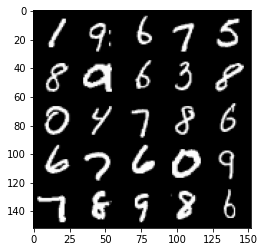

Epoch 199, step 93500: Generator loss: 1.2655355360507947, discriminator loss: 0.4735940357446674


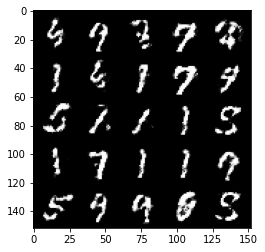

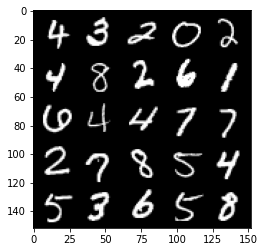

In [19]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
